# 0. Load parameters

In [1]:
# | tags: [parameters]
subject = "101"

In [2]:
import mne
import autoreject
from autoreject import AutoReject
from autoreject import get_rejection_threshold
from mne.preprocessing import ICA
import toml
import mne_bids
import re
from pathlib import Path
import matplotlib
import numpy as np
from ipywidgets import interact
from mne.preprocessing import ICA

from eeglabio.utils import export_mne_raw

mne.viz.set_browser_backend("matplotlib")
# mne.viz.set_browser_backend("qt")
mne.set_config("MNE_BROWSER_THEME", "light")
# matplotlib.use("Agg")


config = toml.load("../../.env.toml")
project_path = config["project"]["path"]

preproc_path = f"{
    project_path}/data/preproc/sub-{subject}/"
figure_path = f"{project_path}/data/preproc/sub-{subject}/figures"


Path(preproc_path).mkdir(parents=True, exist_ok=True)
Path(figure_path).mkdir(parents=True, exist_ok=True)

Using matplotlib as 2D backend.


This file contains preprocessing files after downsampling them.


In [5]:
from meegkit.detrend import detrend
from meegkit import dss
from pyprep.find_noisy_channels import NoisyChannels


# This part could be replaced by read MFF files (set files are just downsampled MFF files saved to the local laptop drive)
def load_data(subject: str) -> mne.io.Raw:
    fname_path = f"{project_path}/data/raw/BIDS/sub-{
        subject}/ses-01/eeg/sub-{subject}_ses-01_task-rest_eeg.set"
    raw = mne.io.read_raw_eeglab(fname_path, preload=True)
    ch_name_type = dict(zip(raw.ch_names, raw.get_channel_types()))
    ch_name_ecg = [name for name in raw.ch_names if name in "ECG"]
    dict_ecg = {sub[0]: "ecg" for sub in (ele.split() for ele in ch_name_ecg)}
    raw.set_channel_types(dict_ecg)
    montage = mne.channels.make_standard_montage("GSN-HydroCel-257")
    raw.set_montage(montage, match_alias={"VREF": "Cz"})
    raw.info["bads"] = ["VREF"]
    return raw


def zapline_clean(raw, fline):
    data = raw.get_data().T  # Convert mne data to numpy darray
    sfreq = raw.info["sfreq"]  # Extract the sampling freq

    # Apply MEEGkit toolbox function
    out, _ = dss.dss_line_iter(
        data, fline, sfreq, nfft=256
    )  # fline (Line noise freq) = 50 Hz for Europe
    cleaned_raw = mne.io.RawArray(
        out.T, raw.info
    )  # Convert output to mne RawArray again

    return cleaned_raw


def detrending(raw, order=10):
    # detrending
    data = raw.get_data().T  # Convert mne data to numpy darray
    # data, _, _ = detrend(data, order=1)
    data, _, _ = detrend(data, order=order)
    detrended_raw = mne.io.RawArray(
        data.T, raw.info
    )  # Convert output to mne RawArray again
    return detrended_raw


def apply_pyprep(raw, save_figs=True):
    nd = NoisyChannels(raw, random_state=1337)
    # nd.find_bad_by_correlation(
    #    correlation_secs=1.0, correlation_threshold=0.4, frac_bad=0.01
    # )
    # nd.find_bad_by_deviation(deviation_threshold=5.0)
    nd.find_all_bads(ransac=True, channel_wise=True, max_chunk_size=None)
    # find bad by RANSAC is conservative estimate
    # nd.find_bad_by_ransac(channel_wise=True)
    # print("bad by ransc", nd.bad_by_ransac)
    # print("bad by deviation", nd.bad_by_deviation)
    # print("bad by correlation", nd.bad_by_correlation)
    print("bad all", nd.get_bads(verbose=True))

    clean_raw = raw.copy()
    clean_raw.info["bads"].extend(nd.bad_by_ransac)
    clean_raw.info["bads"].extend(nd.bad_by_deviation)
    clean_raw.info["bads"].extend(nd.get_bads(verbose=False))

    sensor_plot = clean_raw.plot_sensors(show_names=True)
    if save_figs:
        sensor_plot.savefig(
            f"{figure_path}/sub-{subject}_bad_sensors.png", dpi=300, bbox_inches="tight"
        )
    return clean_raw


def apply_projection(raw):
    raw_clean = raw.copy()
    raw_clean.interpolate_bads()
    raw_clean.set_eeg_reference("average", projection=True)  # compute the reference
    raw_filtered.add_proj(raw_clean.info["projs"][0])
    del raw_clean  # delete the copy
    raw_filtered.apply_proj()  # apply the reference
    return raw_filtered


def plot_step(raw, stage="raw", duration=50.0, n_channels=50):
    raw_detrended_plot = mne.viz.plot_raw(
        raw,
        duration=duration,
        scalings=dict(eeg=1e-4),
        n_channels=n_channels,
        show_scrollbars=False,
    )
    raw_detrended_plot.savefig(
        f"{figure_path}/sub-{subject}_{stage}.png", dpi=300, bbox_inches="tight"
    )
    # Plot is saved to monitor the quality of the data

    raw_detrended_psd = raw.compute_psd(
        method="welch", picks="eeg", exclude="bads"
    ).plot(average=True, picks="eeg", exclude="bads", show=False)
    raw_detrended_psd.savefig(
        f"{figure_path}/sub-{subject}_{stage}-psd.png", dpi=300, bbox_inches="tight"
    )

# 1. Preprocess raw data


Power of components removed by DSS: 0.00
Iteration 0 score: 2.6228277408809893e-10
Power of components removed by DSS: 0.01
Iteration 1 score: 4.370207414556169e-11
Power of components removed by DSS: 0.00
Iteration 2 score: 1.1440901387476022e-11
Power of components removed by DSS: 0.00
Iteration 3 score: 4.993156120652014e-12
Power of components removed by DSS: 0.00
Iteration 4 score: 1.525266764186243e-12
Power of components removed by DSS: 0.00
Iteration 5 score: 9.590209247612588e-13
Power of components removed by DSS: 0.00
Iteration 6 score: 8.418299953054585e-13
Power of components removed by DSS: 0.00
Iteration 7 score: 5.551040960622447e-13
Power of components removed by DSS: 0.00
Iteration 8 score: 4.0374541024858396e-13
Power of components removed by DSS: 0.00
Iteration 9 score: 3.3426447344429146e-13
Power of components removed by DSS: 0.00
Iteration 10 score: 2.8051346489339163e-13
Power of components removed by DSS: 0.00
Iteration 11 score: 2.0118574797330632e-13
Power of

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 82
Total # of chunks: 3
Current chunk:
1
2
3

RANSAC done!
Found 12 uniquely bad channels:

0 by NaN: []

0 by flat: []

1 by deviation: ['E217']

2 by HF noise: ['E216', 'E238']

11 by correlation: ['E9', 'E132', 'E133', 'E145', 'E174', 'E188', 'E216', 'E217', 'E229', 'E251', 'E256']

1 by SNR: ['E216']

0 by dropout: []

0 by RANSAC: []

bad all ['E188', 'E9', 'E238', 'E216', 'E174', 'E217', 'E229', 'E132', 'E145', 'E251', 'E256', 'E133']


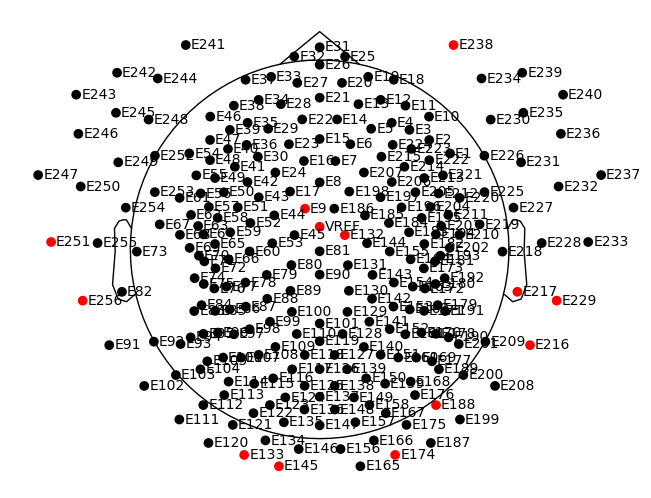

Overwriting existing file.
Writing /Users/daniel/PhD/Projects/psd-path/data/preproc/sub-101/sub-101_zaplined_eeg.fif
Closing /Users/daniel/PhD/Projects/psd-path/data/preproc/sub-101/sub-101_zaplined_eeg.fif
[done]


In [23]:
fline = 50

raw = load_data(subject)
raw_downsampled = raw.copy().crop(tmin=5, tmax=300, include_tmax=True).resample(256)

raw_zapline_1 = zapline_clean(
    raw_downsampled,
    fline,
)

detrended_raw = detrending(raw_zapline_1, order=10)

raw_zapline = zapline_clean(
    detrended_raw,
    fline,
)
clean_raw = apply_pyprep(raw_zapline)
#


# mne.export.export_raw(
#    f"{preproc_path}/sub-{subject}_zaplined.set", overwrite=True
# )
# export_mne_raw(clean_raw, f"{preproc_path}/sub-{subject}_zaplined.set")
clean_raw.save(f"{preproc_path}/sub-{subject}_zaplined_eeg.fif", overwrite=True)

# 2. Work with epochs

In [4]:
def create_epochs(raw):
    length = 5
    events = mne.make_fixed_length_events(
        raw=raw,
        start=0,
        stop=None,
        duration=length,
        overlap=0,
        first_samp=False,
    )

    # Create  Epochs object
    epochs = mne.Epochs(
        raw=raw,
        events=events,
        tmin=0,
        tmax=length,
        detrend=1,  # from 0 to 1
        baseline=None,
        preload=True,
    )
    return epochs


def plot_epochs(epochs, stage="epochs", n_epochs=10, n_channels=10):
    # plot the data
    epochs_plot = epochs.copy().average().detrend().plot_joint()
    epochs_plot.savefig(
        f"{figure_path}/sub-{subject}_{stage}.png", dpi=300, bbox_inches="tight"
    )
    mne.viz.plot_epochs(
        epochs=epochs,
        picks="eeg",
        show=False,
        n_epochs=n_epochs,
        n_channels=n_channels,
        scalings=dict(eeg=1e-4),
    )
    epochs_plot_psd = epochs.compute_psd(
        method="welch", picks="eeg", fmax=100.0, exclude="bads"
    ).plot(average=True, picks="eeg", exclude="bads", show=False)
    epochs_plot_psd.savefig(
        f"{figure_path}/sub-{subject}_{stage}_psd.png", dpi=300, bbox_inches="tight"
    )

def compute_ica(
    eeg_data,
    reject_log=None,
    n_components=0.999,
    method="picard",
    random_state=99,
):
    """Compute ICA on the data without really bad epochs"""
    if reject_log is not None:
        eeg_data = eeg_data[~reject_log.bad_epochs].copy()
    ica = ICA(
        n_components=n_components,
        random_state=random_state,
        method="picard",
        fit_params=dict(ortho=False, extended=True),
    )
    ica.fit(eeg_data)

    return ica

def label_components_ica(eeg_data, ica, reject_log=None):
    """Assign the IC labels"""
    if reject_log is not None:
        eeg_data = eeg_data[~reject_log.bad_epochs].copy()
    raw_avg_ref = (
        eeg_data.copy()
        .set_eeg_reference(ref_channels="average")
        .filter(l_freq=None, h_freq=100)
    )
    ic_labels = label_components(raw_avg_ref, ica, method="iclabel")
    labels = ic_labels["labels"]
    return labels


def get_values(labels):
    """Get the indices of the labels"""
    element_indices = {}

    for i, element in enumerate(labels):
        if element not in element_indices:
            element_indices[element] = []
        element_indices[element].append(i)

    display(element_indices)
    return element_indices


def plot_ica_components(ica, eeg_data, labels, reject_log=None, plot_properties=False):
    """Plot the ICA components"""

    if reject_log is not None:
        eeg_data = eeg_data[~reject_log.bad_epochs].copy()

    labeled_components = get_values(labels)

    for label, indices in labeled_components.items():
        display(label, indices)
        # ica_plot = ica.plot_sources(
        #    eeg_data, show_scrollbars=False, picks=slice(0, 20))
        ica_plot = ica.plot_sources(
            eeg_data, show_scrollbars=False, picks=indices)
        ica_plot = ica.plot_components(picks=indices)
        print(indices)
        ica.plot_properties(eeg_data, picks=indices, psd_args={"fmax": 100.0})

        if plot_properties:
            for idx in indices:
                # ica.exclude.append(idx)
                print(idx, label)
                ica.plot_properties(
                    eeg_data, picks=[idx], psd_args={"fmax": 100.0})

Opening raw data file /Users/daniel/PhD/Projects/psd-path/data/preproc/sub-101//sub-101_zaplined_eeg.fif...
    Range : 0 ... 75519 =      0.000 ...   294.996 secs
Ready.
Reading 0 ... 75519  =      0.000 ...   294.996 secs...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal highpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-12 dB cutoff frequency: 0.50 Hz)
- Filter length: 1690 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.8s


Fitting ICA to data using 244 channels (please be patient, this may take a while)
Selecting by explained variance: 33 components
Fitting ICA took 11.0s.


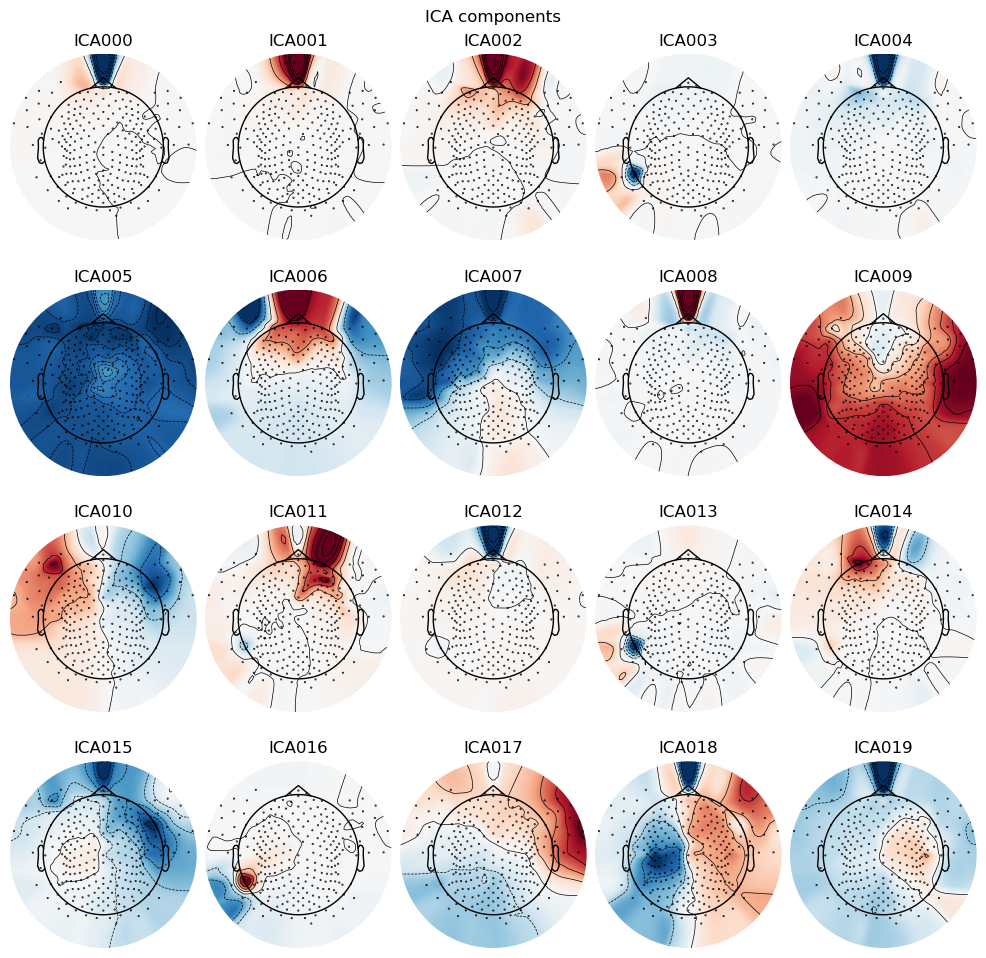

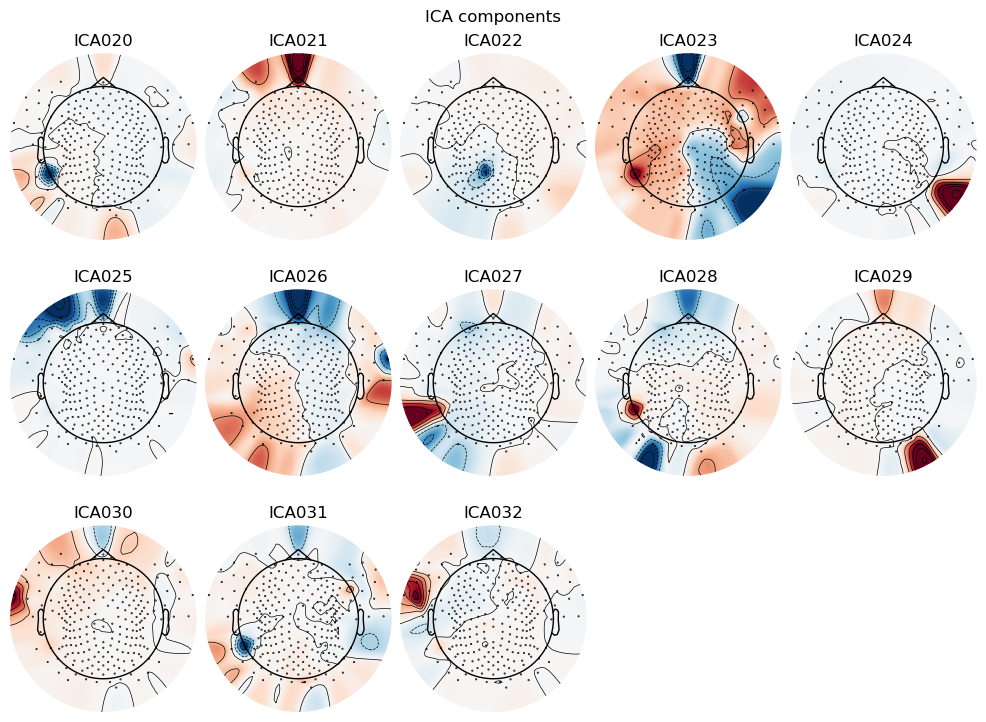

Creating RawArray with float64 data, n_channels=34, n_times=75520
    Range : 0 ... 75519 =      0.000 ...   294.996 secs
Ready.


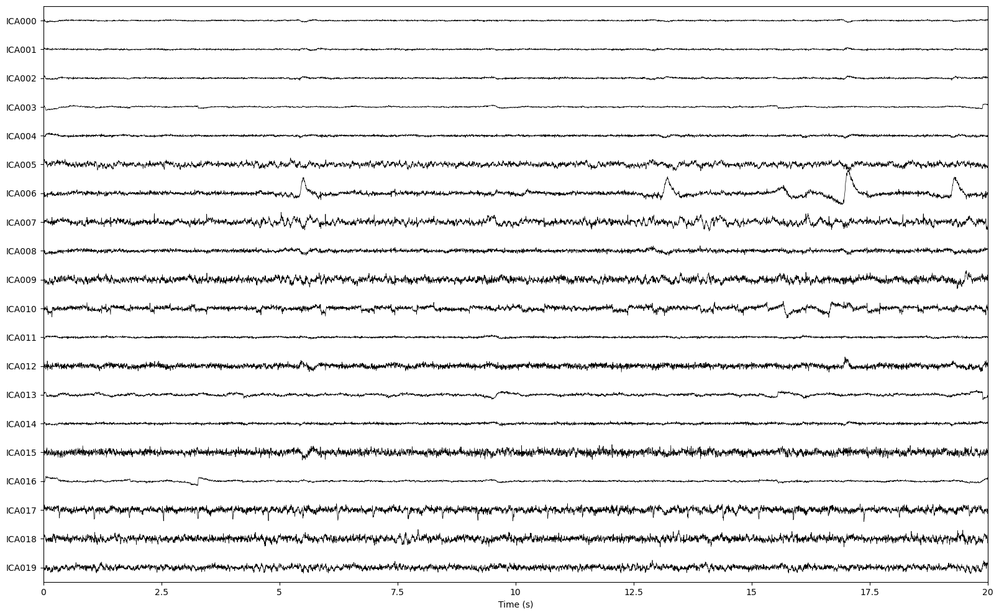

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 pro

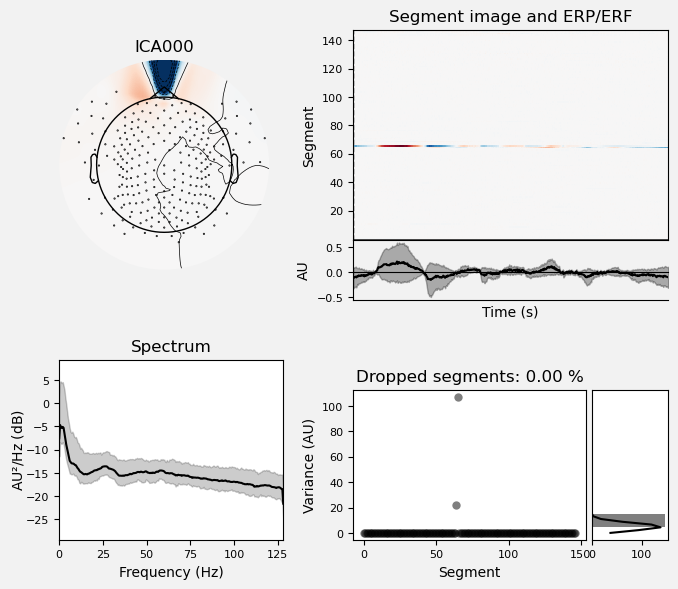

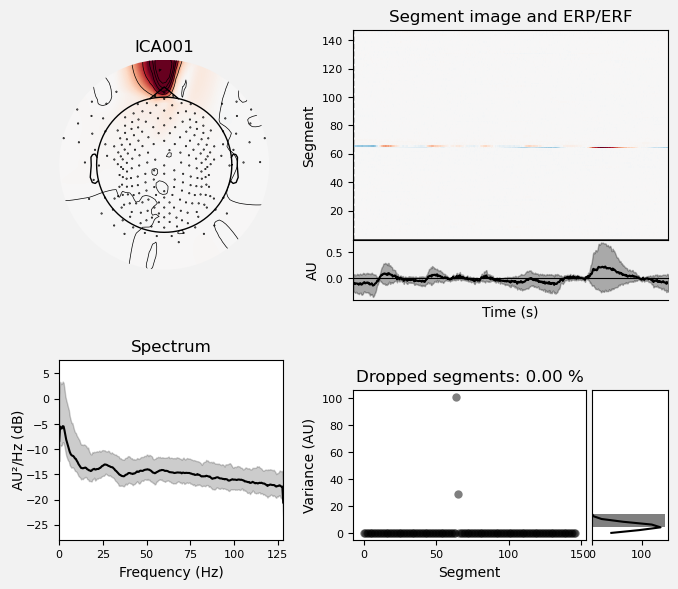

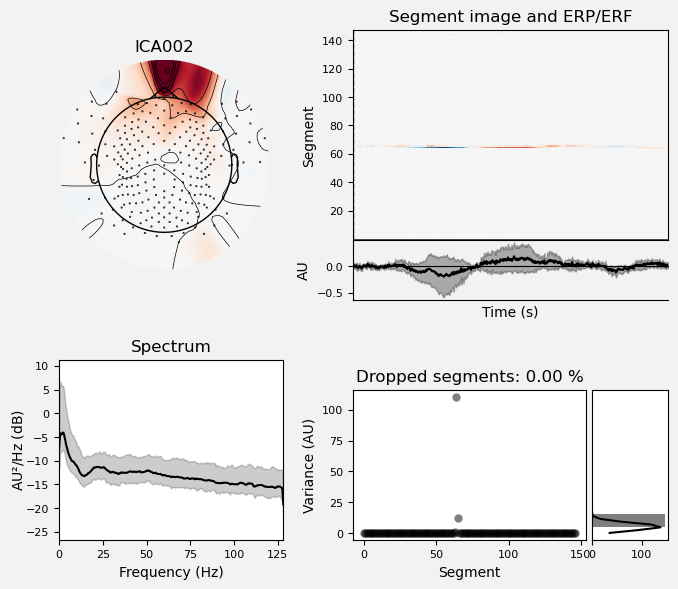

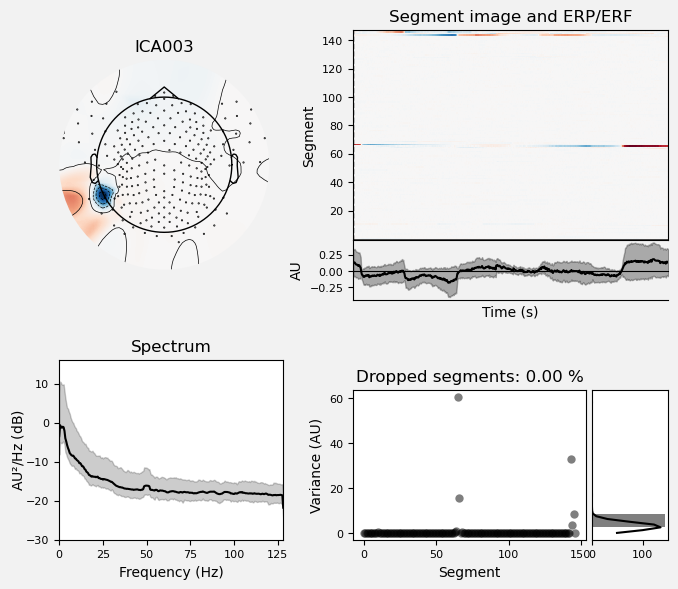

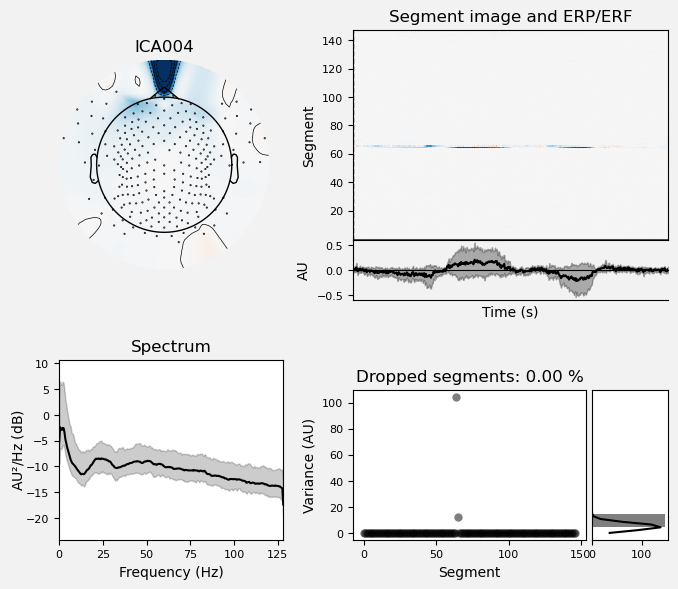

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [46]:
clean_raw = mne.io.read_raw_fif(
    f"{preproc_path}/sub-{subject}_zaplined_eeg.fif", preload=True
)

filter_params = {
    "l_freq": 1,
    "h_freq": None,
    "h_trans_bandwidth": 5,
    "fir_design": "firwin2",
    "phase": "zero-double",
}
# .notch_filter(freqs=50)  # removedrifts
raw_filtered = clean_raw.copy().filter(**filter_params)

ica = compute_ica(raw_filtered, reject_log=None, n_components=0.99, method="picard")
ica.plot_components()
ica.plot_sources(raw_filtered, show_scrollbars=False)
ica.plot_properties(raw_filtered)

Opening raw data file /Users/daniel/PhD/Projects/psd-path/data/preproc/sub-101//sub-101_zaplined_eeg.fif...
    Range : 0 ... 75519 =      0.000 ...   294.996 secs
Ready.
Reading 0 ... 75519  =      0.000 ...   294.996 secs...


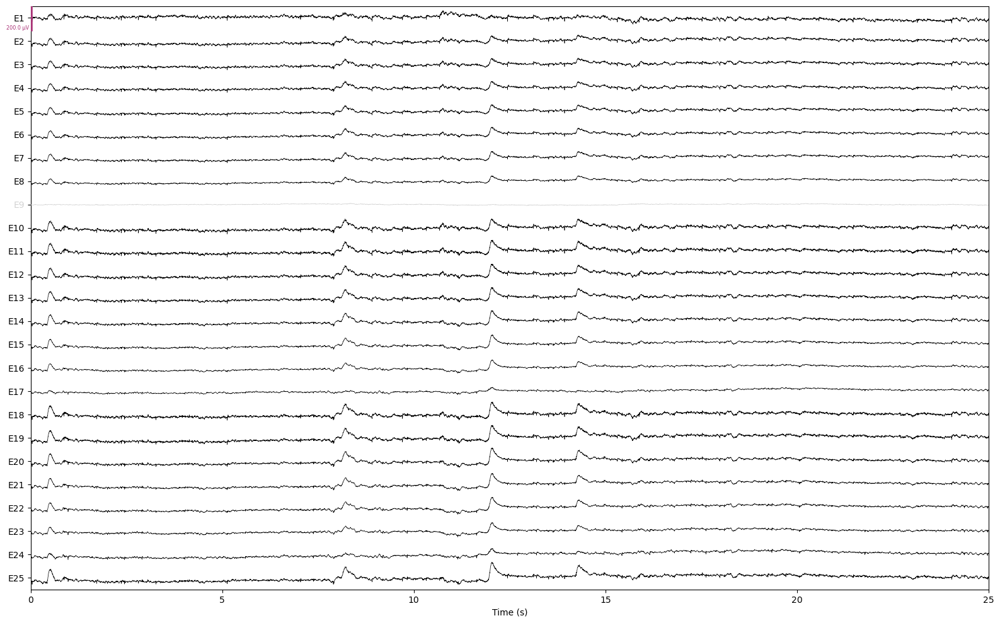

Effective window size : 8.000 (s)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-12 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 5.00 Hz (-12 dB cutoff frequency: 102.50 Hz)
- Filter length: 1690 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s


Not setting metadata
58 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 58 events and 1281 original time points ...


[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s


1 bad epochs dropped
No projector specified for this dataset. Please consider the method self.add_proj.


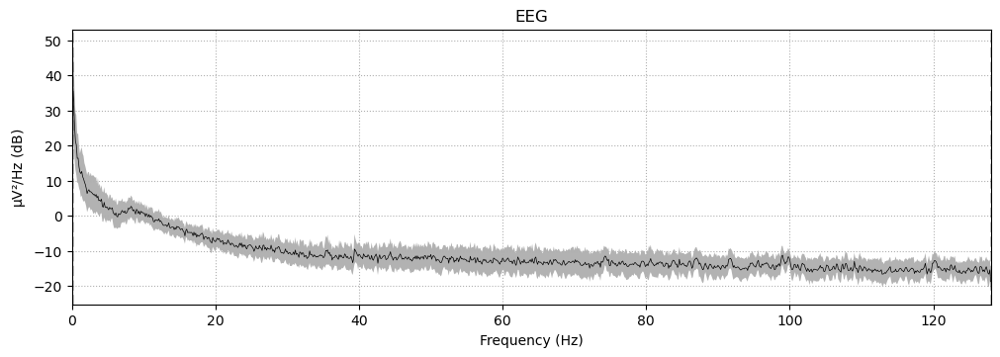

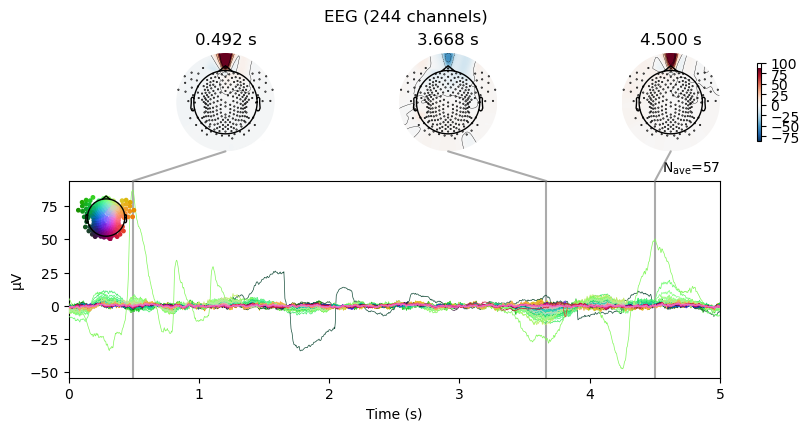

Effective window size : 5.004 (s)
Averaging across epochs...


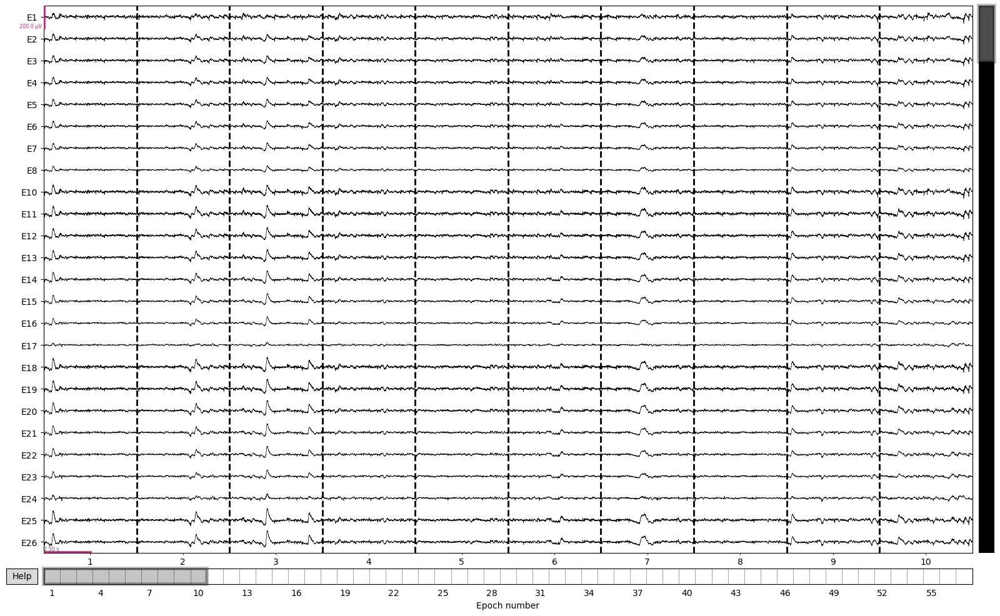

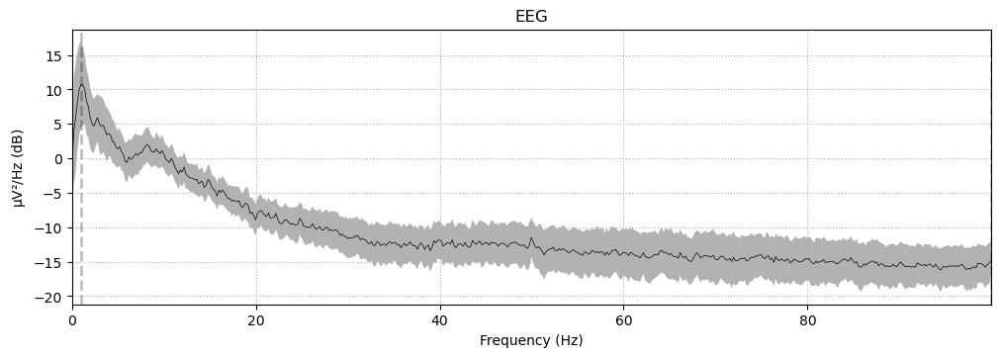

In [25]:
# non-filterd epochs ICAs
from mne_icalabel import label_components
from autoreject import get_rejection_threshold  # noqa

clean_raw = mne.io.read_raw_fif(
    f"{preproc_path}/sub-{subject}_zaplined_eeg.fif", preload=True
)
plot_step(clean_raw, stage="clean_raw ", duration=25.0, n_channels=25)
clean_raw.info

filter_params = {
    "l_freq": 1,
    "h_freq": 100,
    "h_trans_bandwidth": 5,
    "fir_design": "firwin2",
    "phase": "zero-double",
}
# .notch_filter(freqs=50)  # removedrifts
raw_filtered = clean_raw.copy().filter(**filter_params)


epochs = create_epochs(raw_filtered)
plot_epochs(epochs, stage="epochs", n_epochs=10, n_channels=25)

# reject = autoreject.get_rejection_threshold(
#    epochs, ch_types="eeg", random_state=99)
# print(reject)
# Autoreject (local) epochs to benefit ICA (fit on 20 epochs to save time)

Dropped 4 epochs: 24, 25, 42, 56
No projector specified for this dataset. Please consider the method self.add_proj.


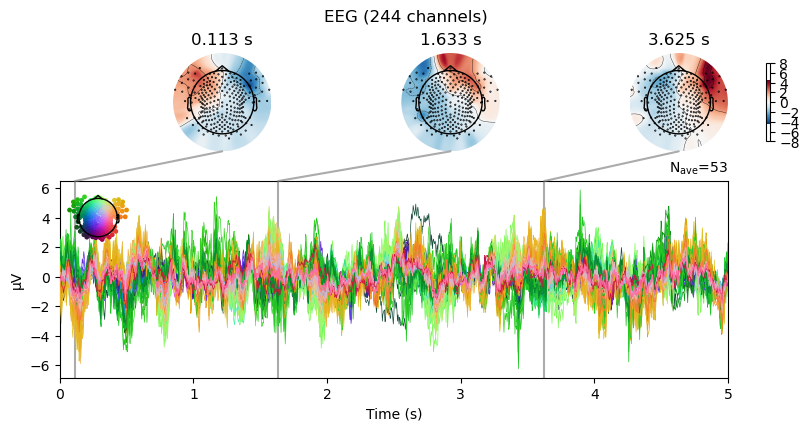

Effective window size : 5.004 (s)
Averaging across epochs...


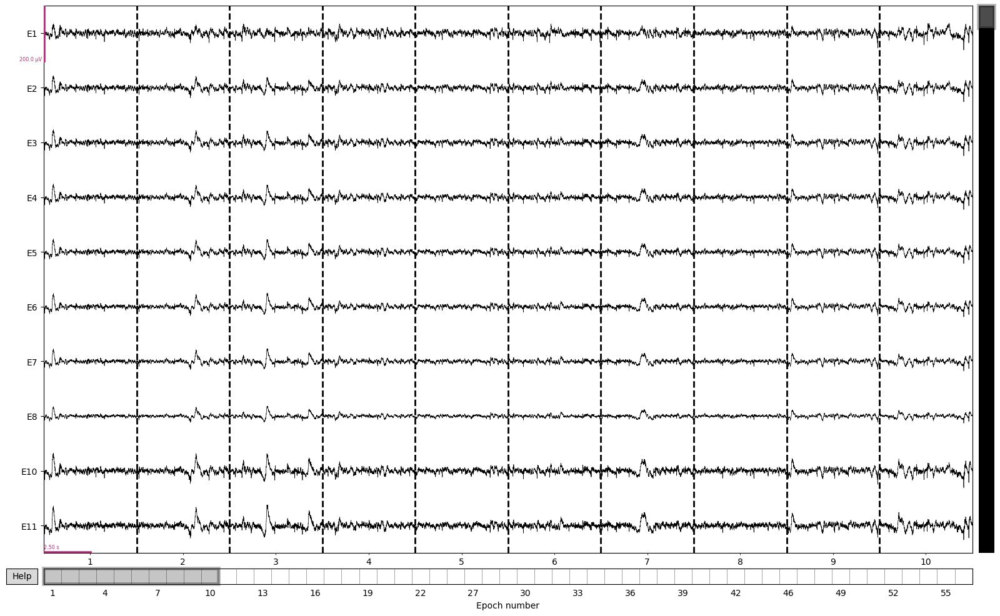

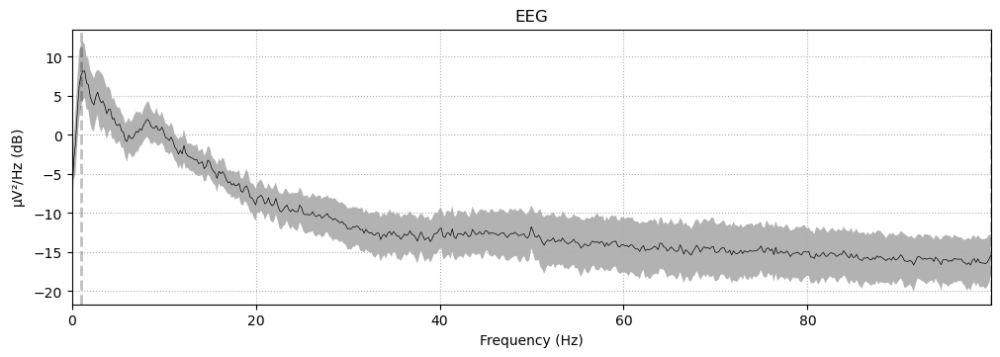

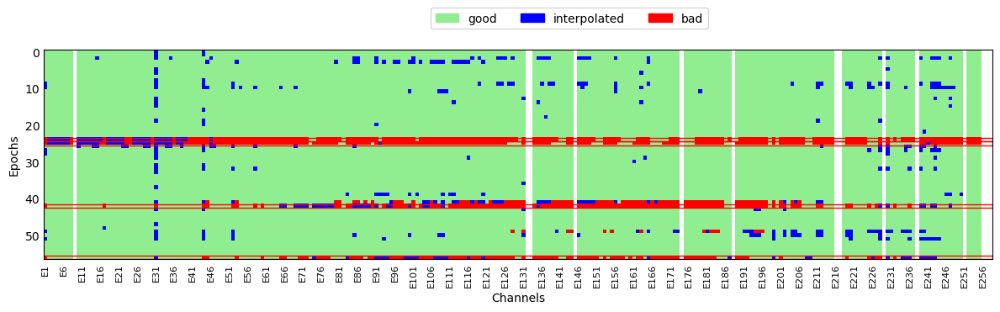

In [26]:
auto_reject_pre_ica = AutoReject(
    n_interpolate=[1, 2, 4, 8, 32, 64, 128],
    n_jobs=-1,
    random_state=100,
    thresh_method="random_search",
    verbose=False,
    # n_interpolate=np.array([0]),
    # consensus=0.8,
).fit(epochs)
epochs_ar, reject_log = auto_reject_pre_ica.transform(epochs, return_log=True)

plot_epochs(
    epochs[~reject_log.bad_epochs],
    stage="autoreject_good_epochs",
    n_epochs=10,
    n_channels=10,
)
reject_plot = reject_log.plot("vertical")
# maybe I should save the autoreject  object?

In [7]:
# reject_log_plot = reject_log.plot_epochs(epochs[reject_log.bad_epochs], scalings=dict(eeg=1e-4))
with mne.viz.use_browser_backend("qt"):
    plot_bad_epochs = epochs[reject_log.bad_epochs].plot(
        scalings=dict(eeg=1e-4))

2024-03-17 14:29:04,412 - OpenGL.acceleratesupport - INFO - No OpenGL_accelerate module loaded: No module named 'OpenGL_accelerate'


Using qt as 2D backend.
Using pyopengl with version 3.1.6
Using matplotlib as 2D backend.


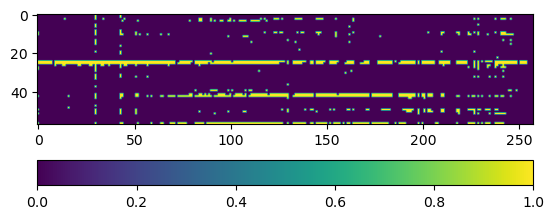

Currently removed number of epochs 4
Percentage of good epochs in each  candidate for removal epoch:
Epoch 24: 18.60%
Epoch 25: 21.71%
Epoch 41: 59.30%
Epoch 42: 42.25%
Epoch 56: 50.78%


In [27]:
import numpy as np
import matplotlib.pyplot as plt

bads = np.logical_or(reject_log.labels == 1, reject_log.labels == 2)
plt.imshow(bads, cmap="viridis")
plt.colorbar(orientation="horizontal", pad=0.1)
plt.show()

print(f"Currently removed number of epochs {np.sum(reject_log.bad_epochs)}")

# print(bads)
# print(bads.shape)
good_epochs_percentage = (1 - bads.mean(axis=1)) * 100

# print("Percentage of bad epochs in each epoch:")
# display(good_epochs_percentage)

print("Percentage of good epochs in each  candidate for removal epoch:")
for i in range(0, len(good_epochs_percentage)):
    if good_epochs_percentage[i] < 75:
        print(f"Epoch {i}: {good_epochs_percentage[i]:.2f}%")
        # print(f"Epoch {i}: {good_epochs_percentage[i]:.2f}%")

In [33]:
from mne_icalabel import label_components

# return labels

# exclude = [idx for idx, label in enumerate(
#    labels) if label in exclude_types]
# filtered_labels = [label for i, label in enumerate(labels) if i in exclude]
# fist only names of components
# for item, label in zip(exclude, filtered_labels):
#    print(item, label)
# then plot the properties


ica = compute_ica(epochs, reject_log=reject_log,
                  n_components=0.99, method="picard")
# ica = compute_ica(epochs, reject_log=None, n_components=0.995, method="picard")
# ica_plot = ica.plot_components()

Fitting ICA to data using 244 channels (please be patient, this may take a while)
Selecting by explained variance: 41 components
Fitting ICA took 18.8s.


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Setting up low-pass filter at 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 25.00 Hz (-6 dB cutoff frequency: 112.50 Hz)
- Filter length: 35 samples (0.137 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    1.4s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done 3041 tasks      | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done 3527 tasks      | elapsed:    2.5s
[Parallel(n_jobs=1)]: Done 4049 tasks      | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done 4607 tasks      | elapsed:    2.9s
[Parallel(n_job

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


{'other': [0, 3, 10, 11, 16, 17, 18, 24, 26, 33, 35, 36],
 'brain': [1, 2, 6, 7, 9, 13, 21, 22, 27, 30, 37],
 'heart beat': [4, 8],
 'eye blink': [5, 12],
 'muscle artifact': [14, 15, 20, 23, 25, 29, 31, 34],
 'channel noise': [19, 28, 32, 38, 39, 40]}

'other'

[0, 3, 10, 11, 16, 17, 18, 24, 26, 33, 35, 36]

Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated


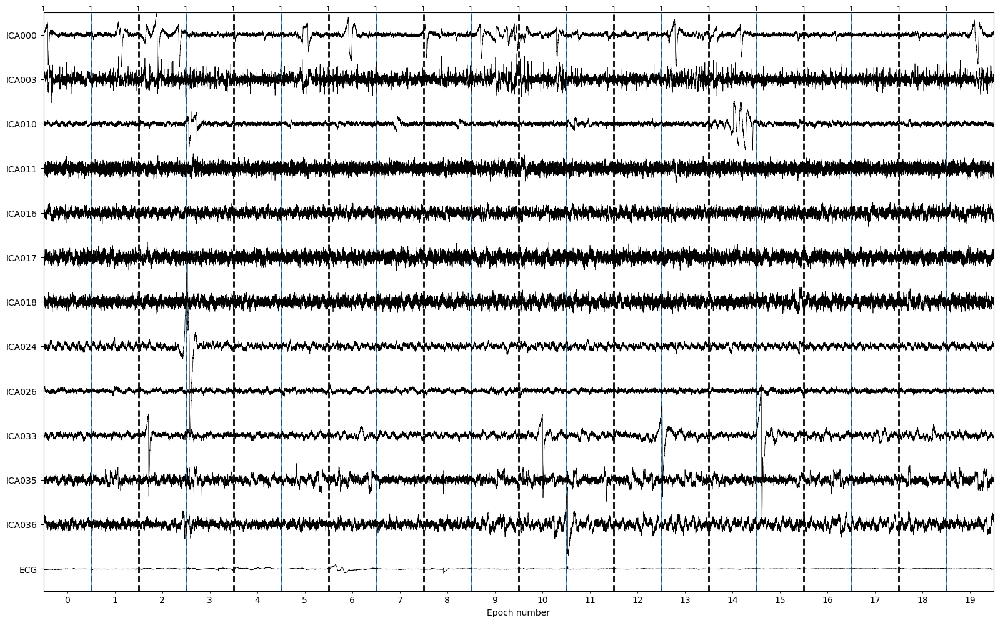

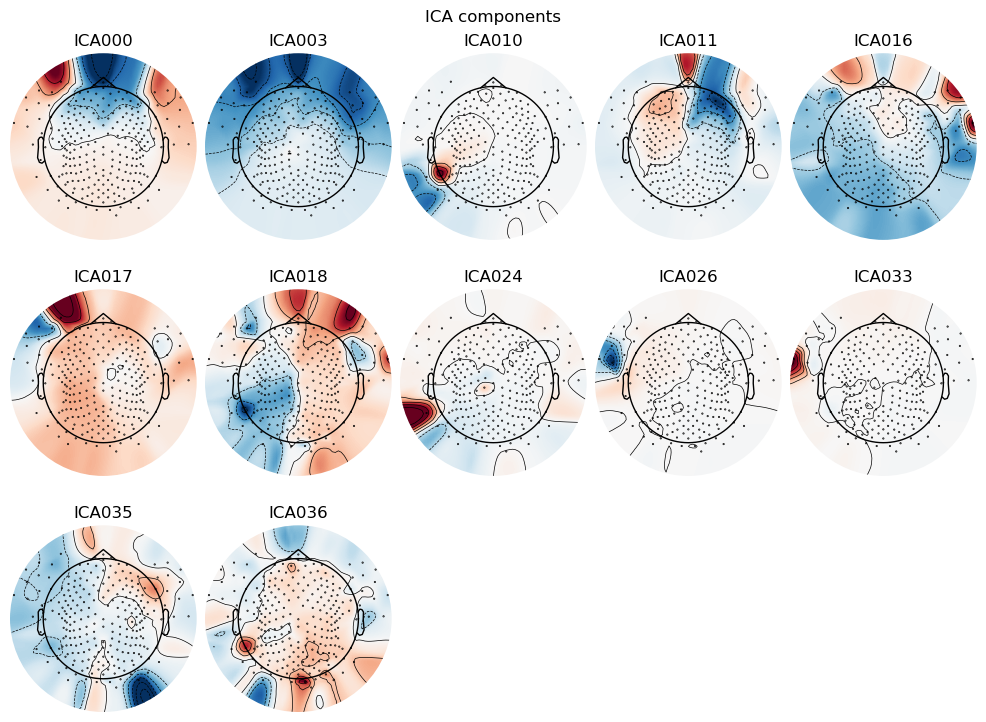

[0, 3, 10, 11, 16, 17, 18, 24, 26, 33, 35, 36]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events foun

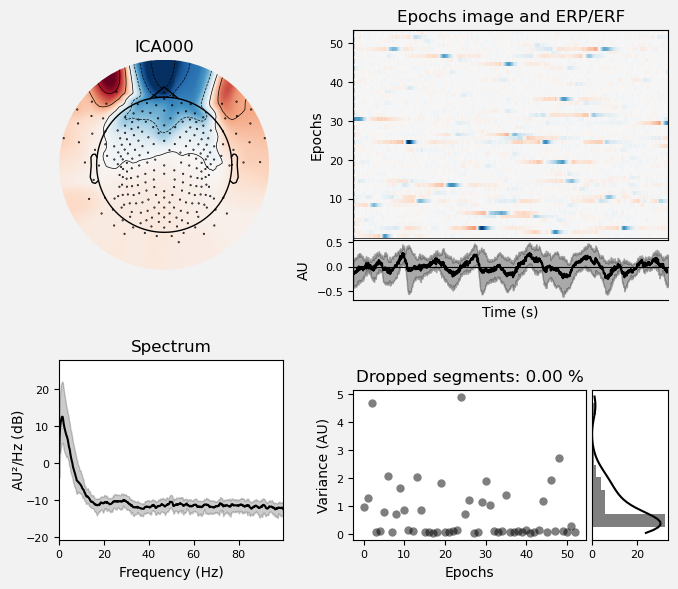

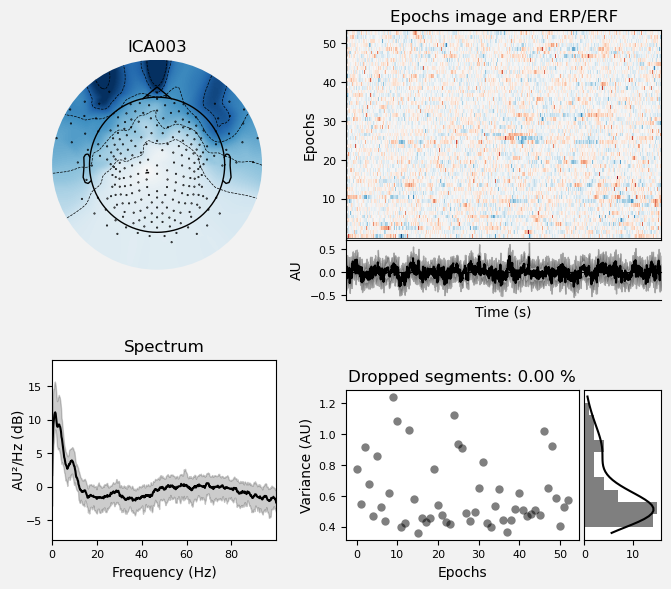

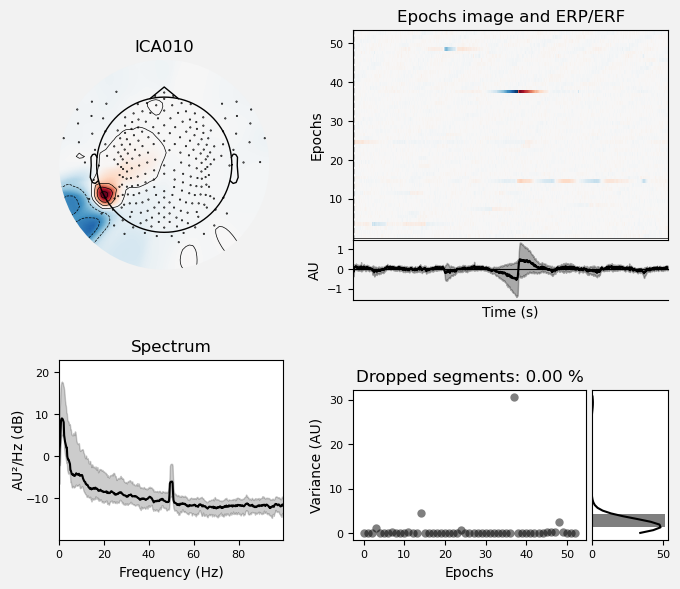

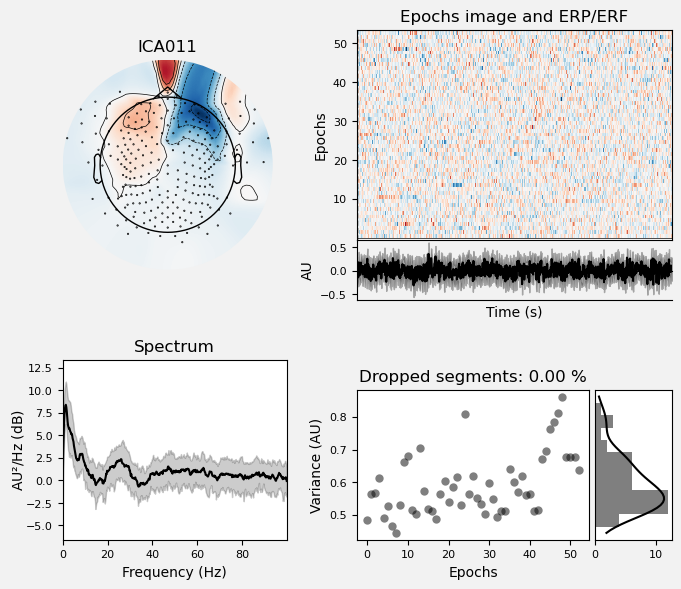

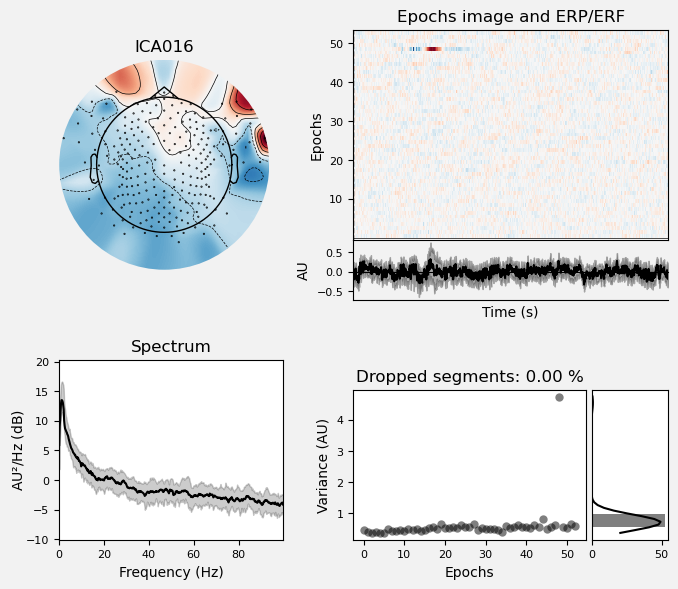

...

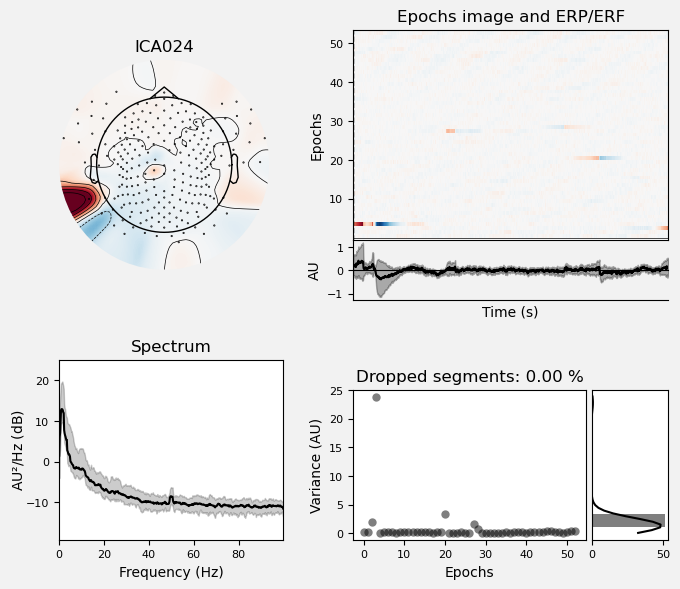

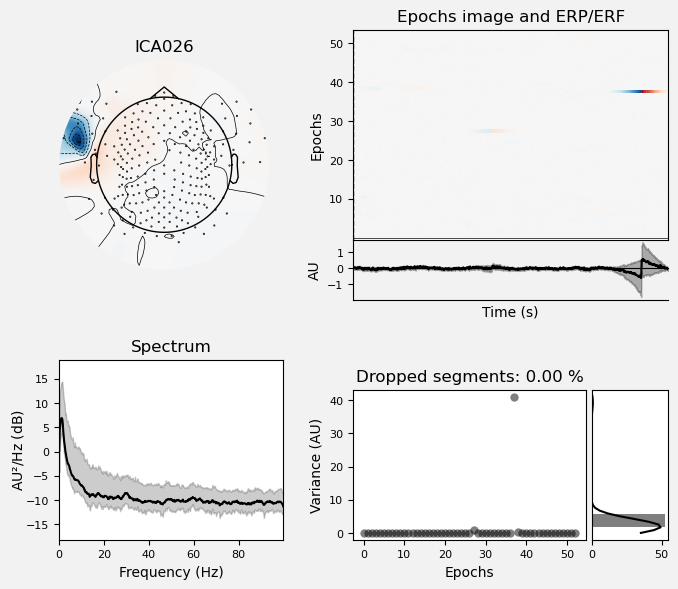

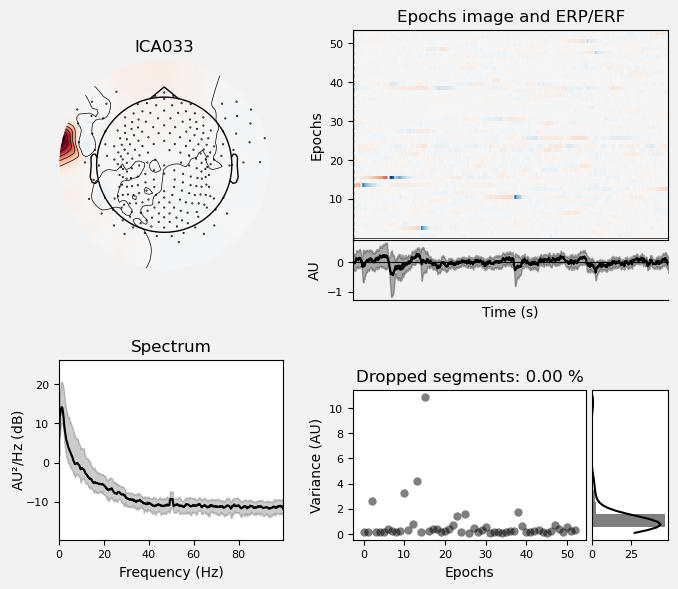

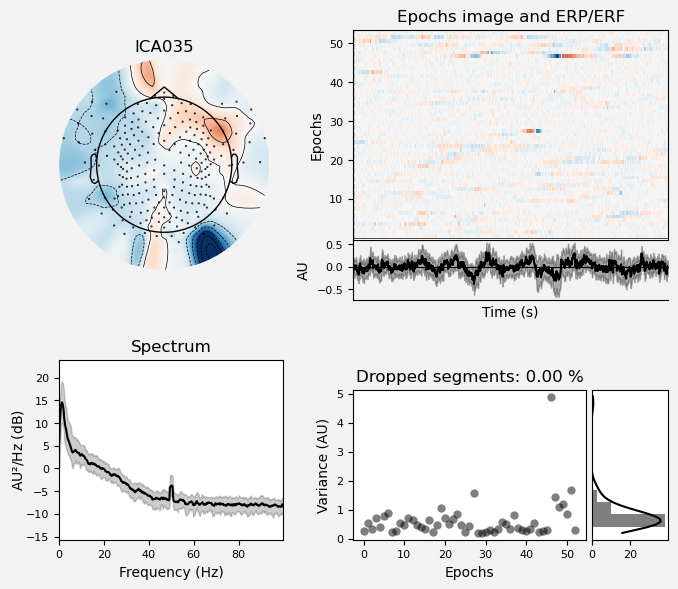

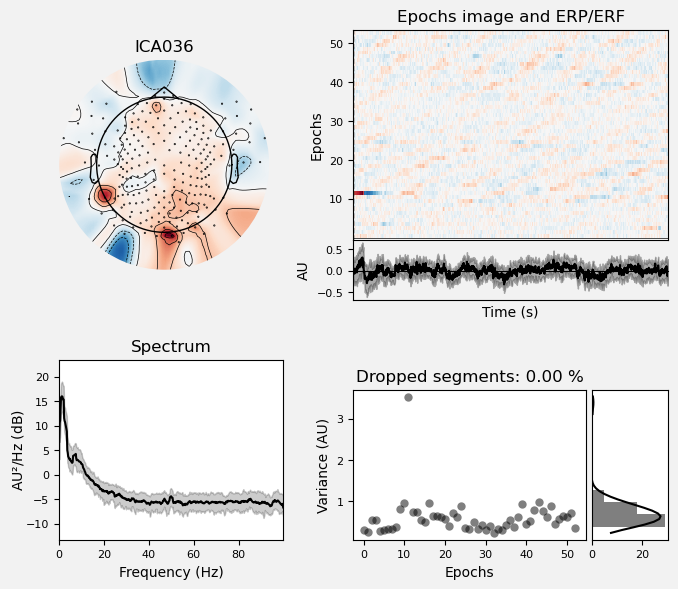

'brain'

[1, 2, 6, 7, 9, 13, 21, 22, 27, 30, 37]

Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated


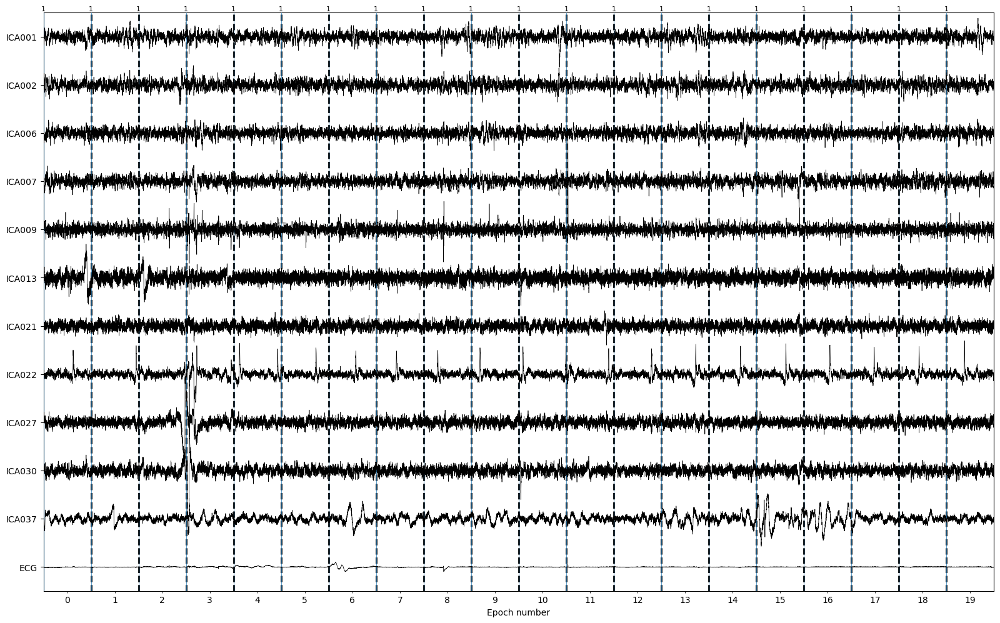

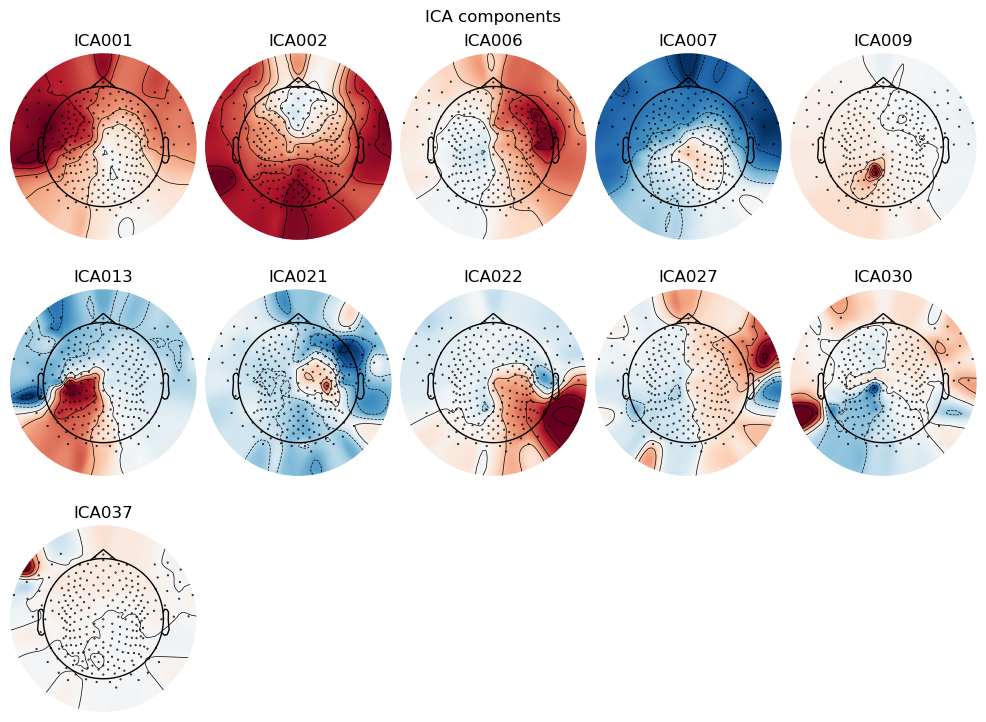

[1, 2, 6, 7, 9, 13, 21, 22, 27, 30, 37]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No ba

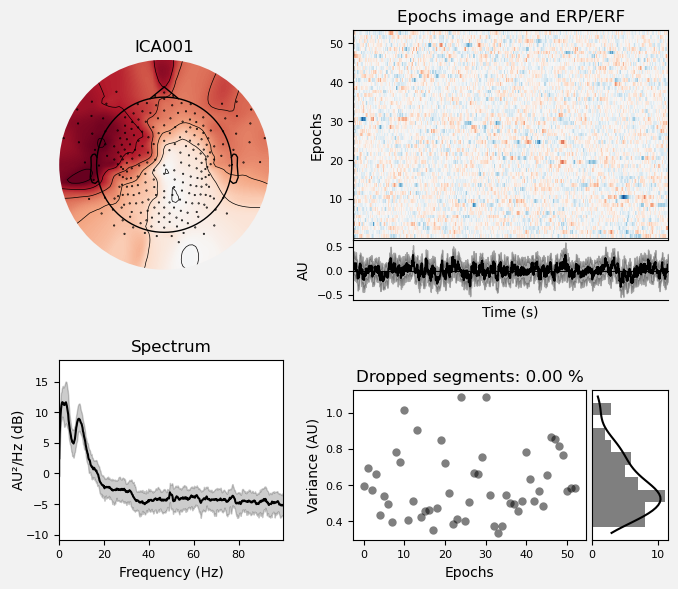

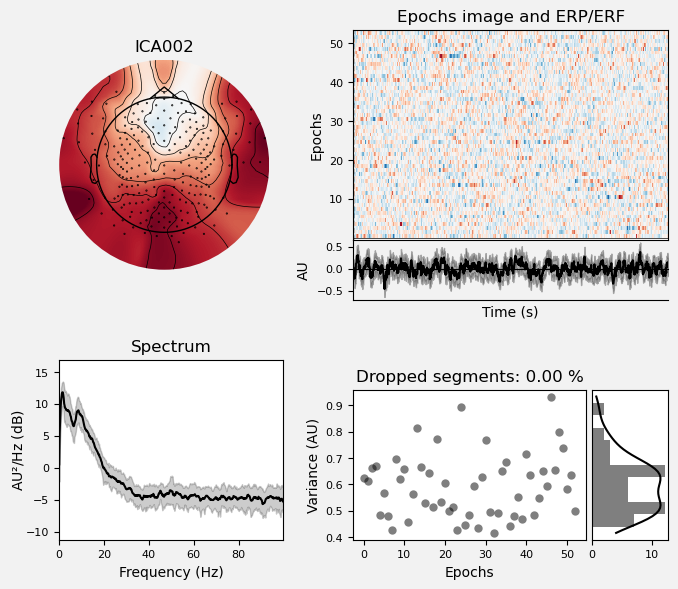

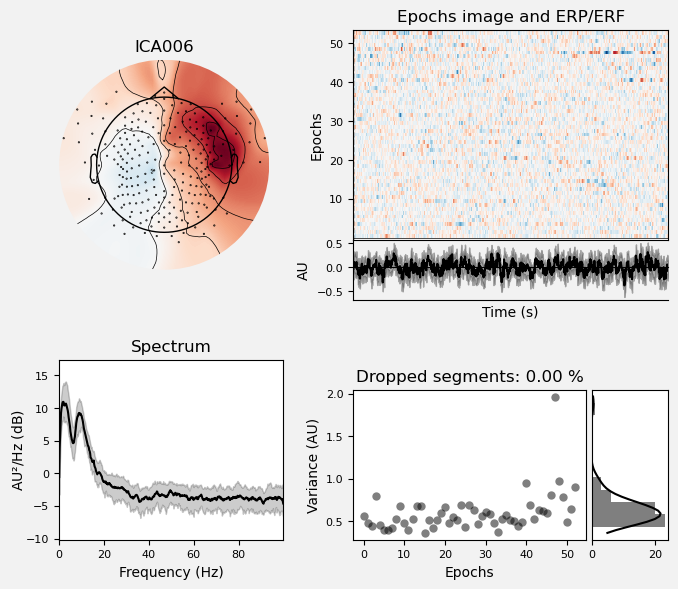

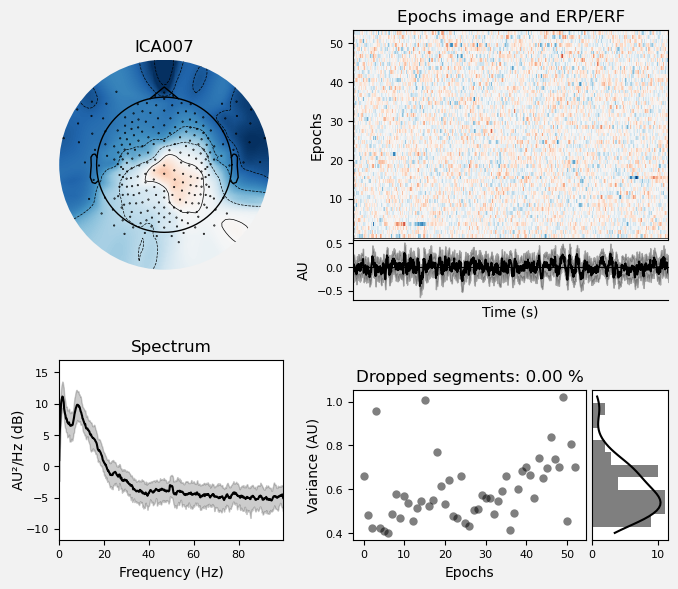

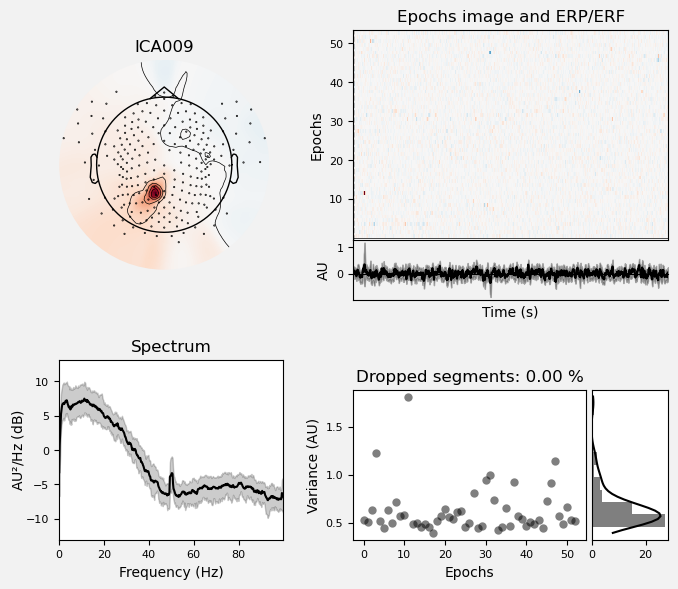

...

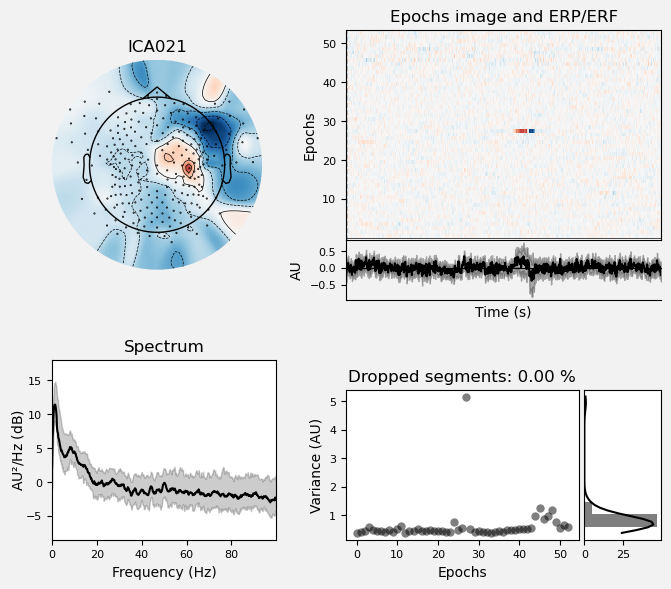

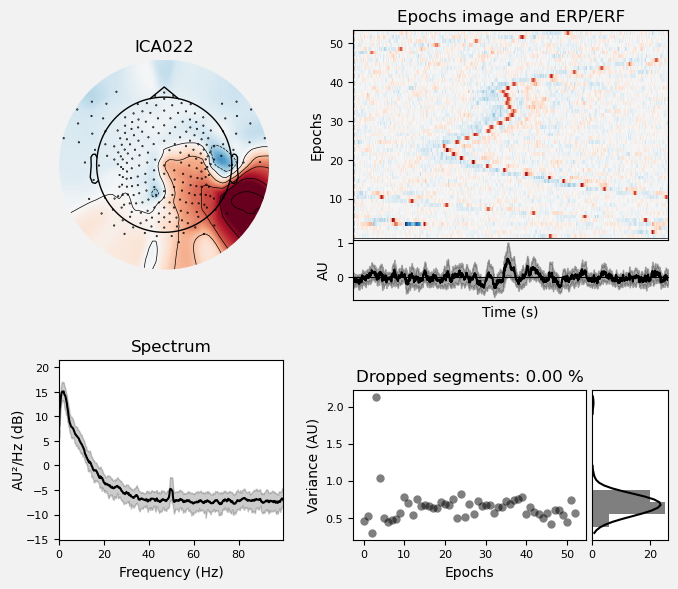

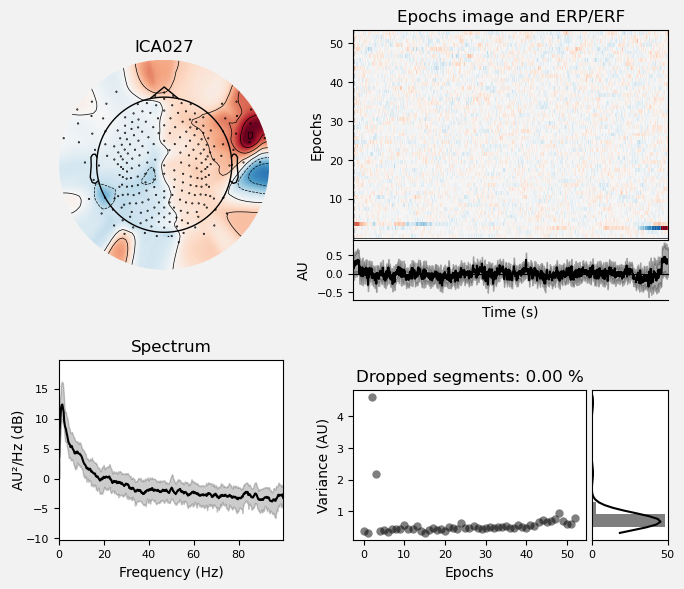

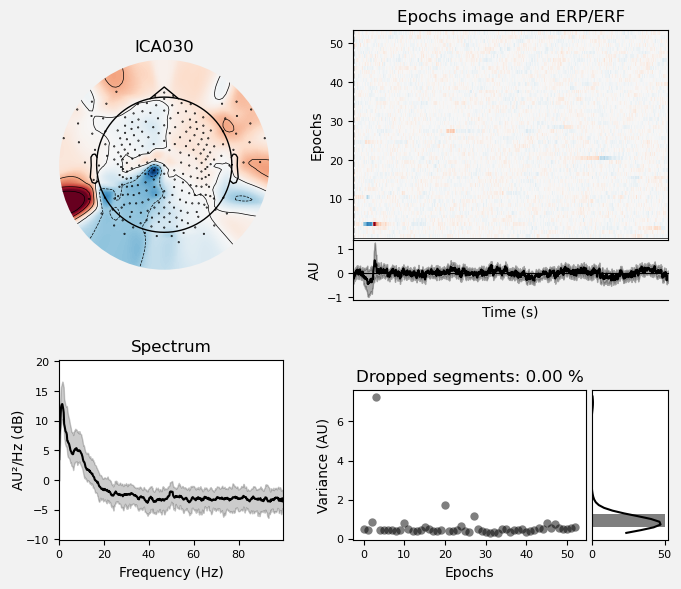

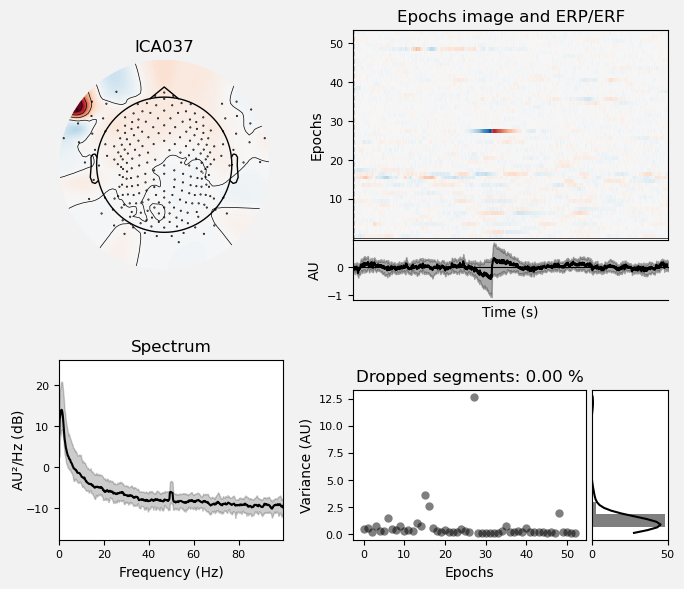

'heart beat'

[4, 8]

Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated


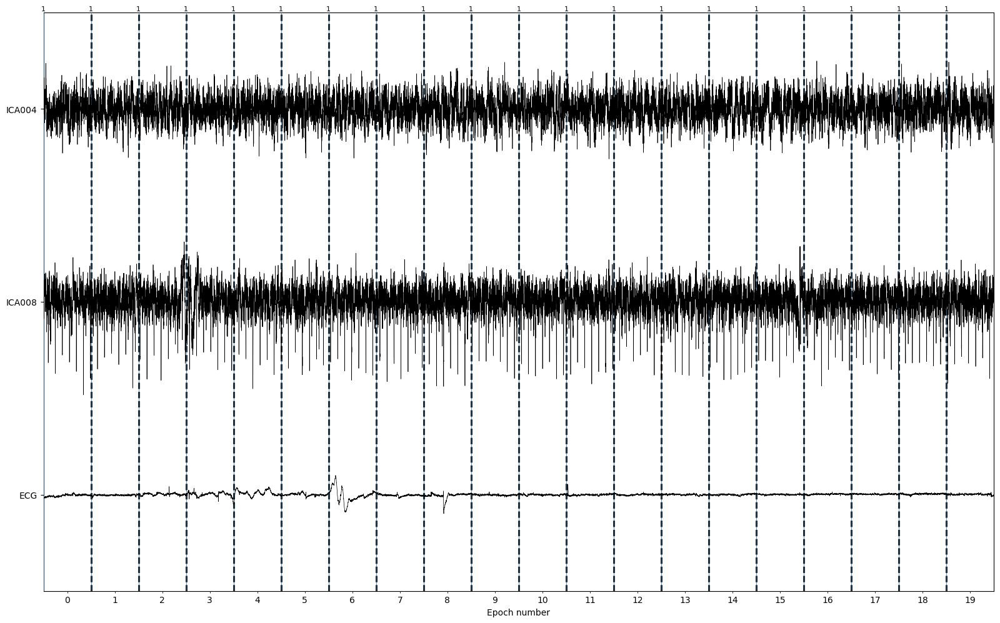

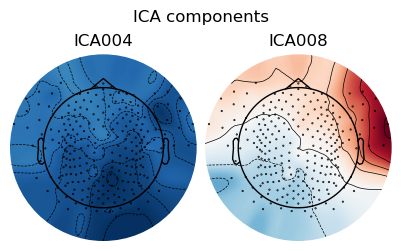

[4, 8]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated


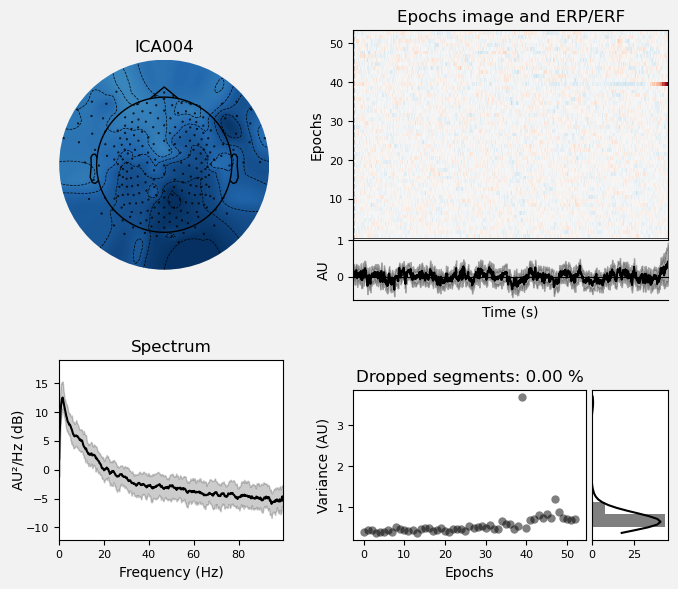

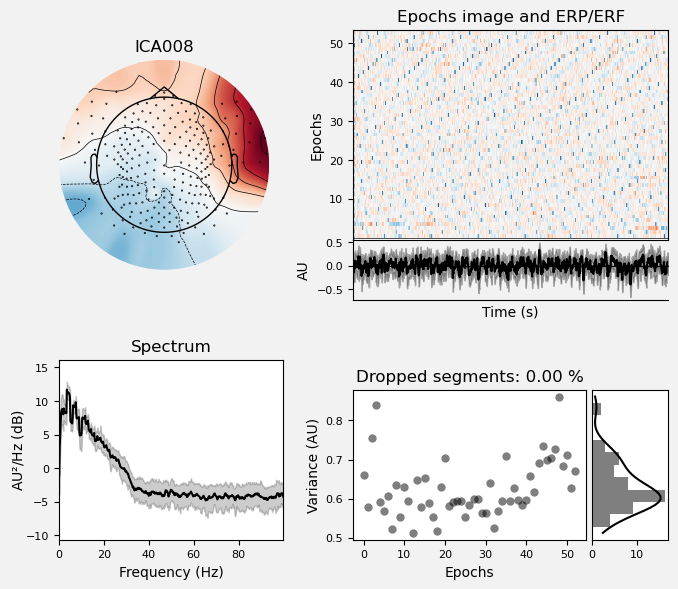

'eye blink'

[5, 12]

Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated


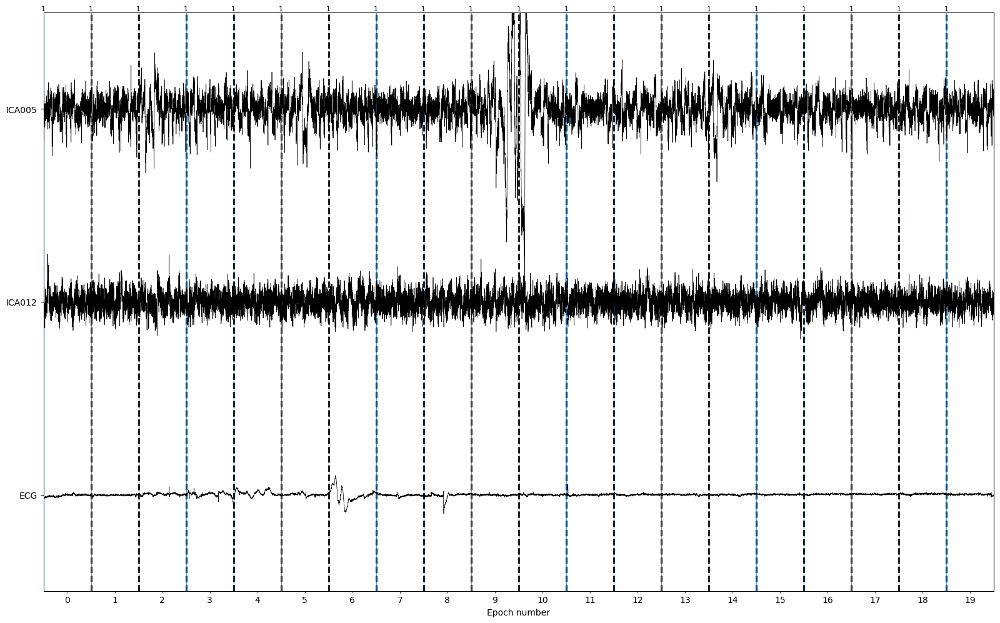

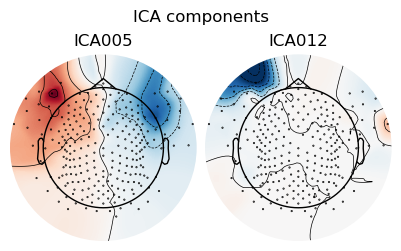

[5, 12]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated


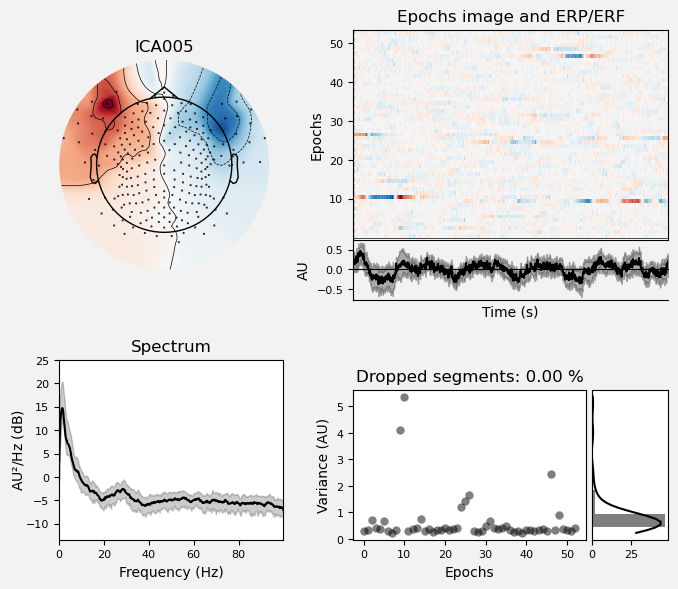

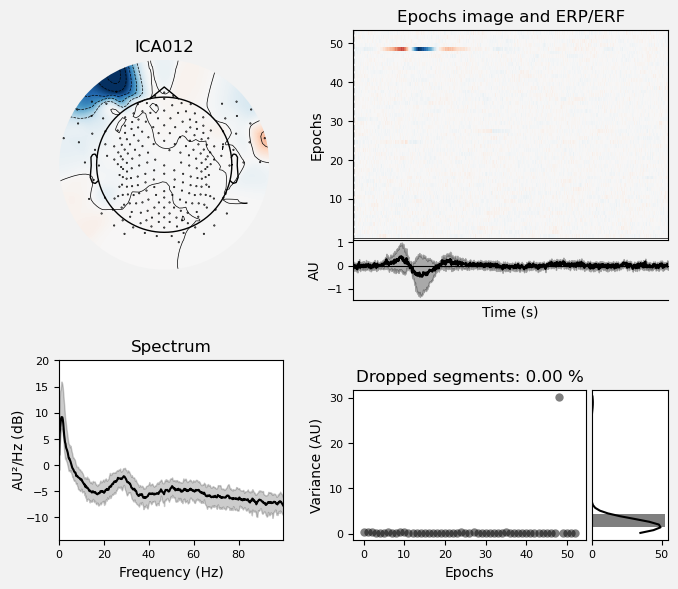

'muscle artifact'

[14, 15, 20, 23, 25, 29, 31, 34]

Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated


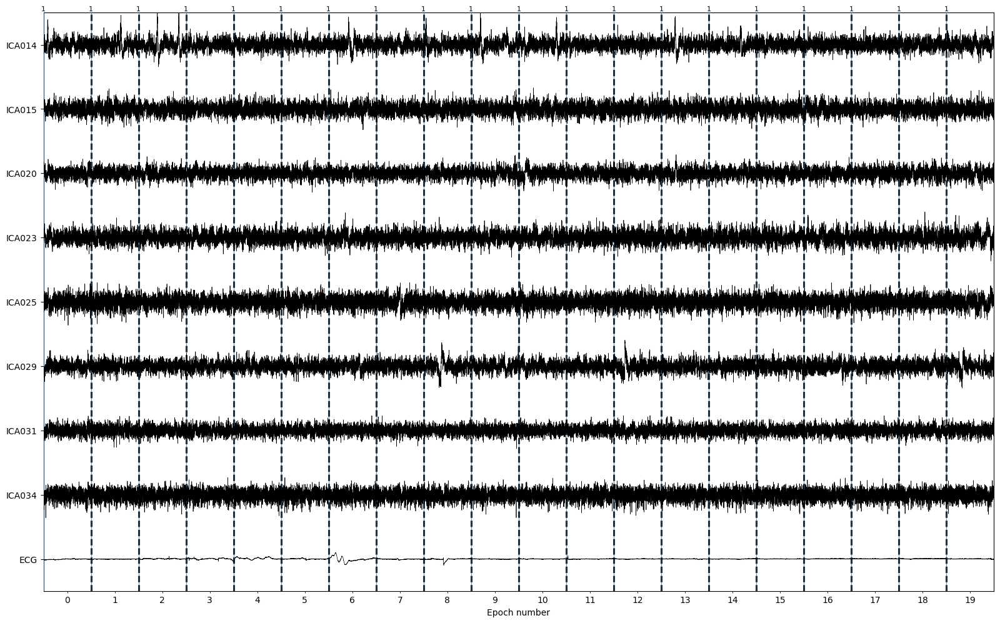

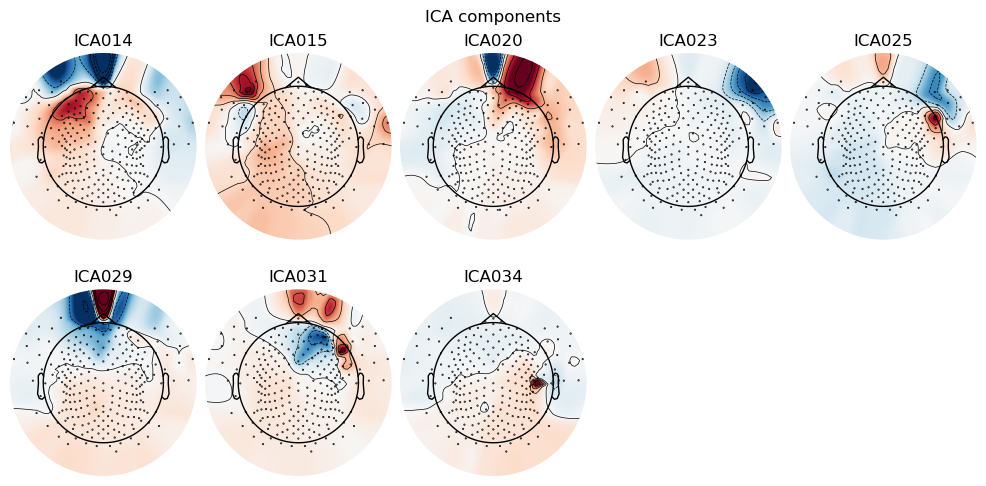

[14, 15, 20, 23, 25, 29, 31, 34]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline 

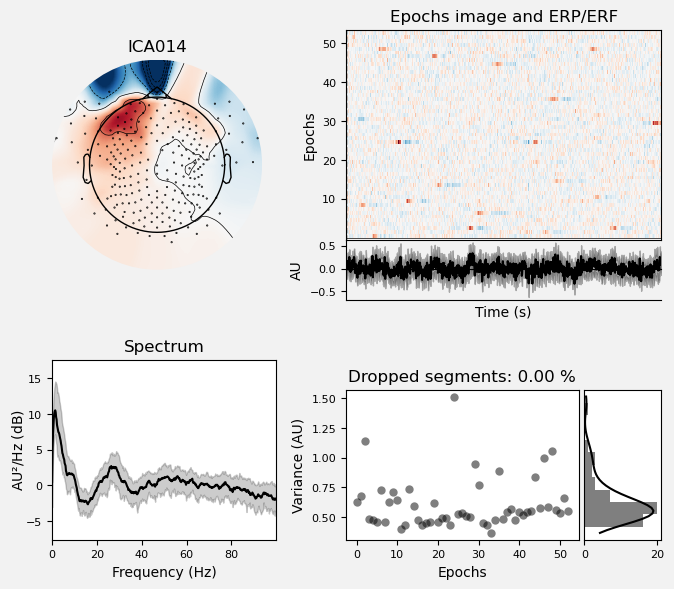

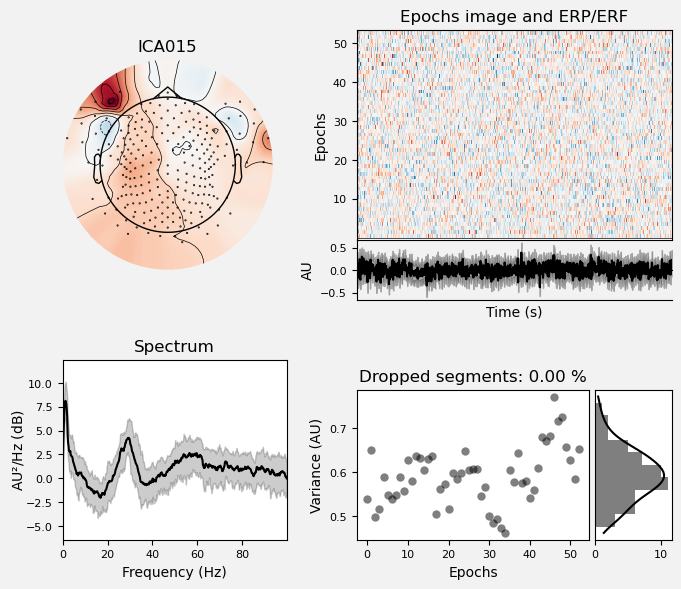

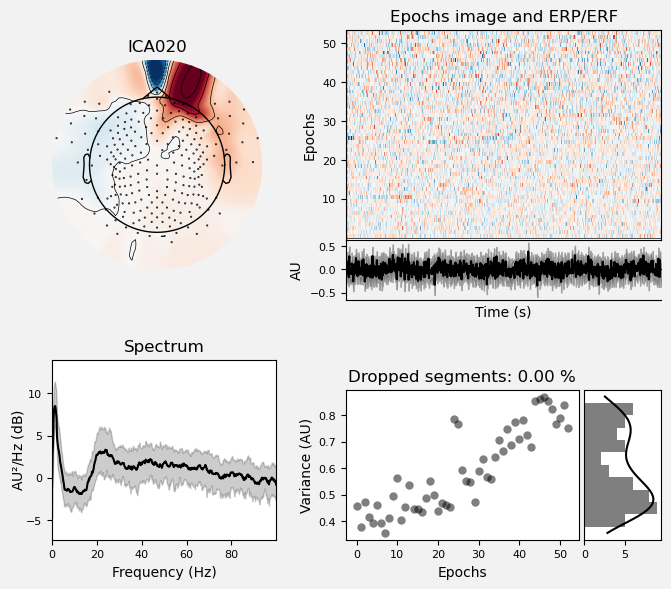

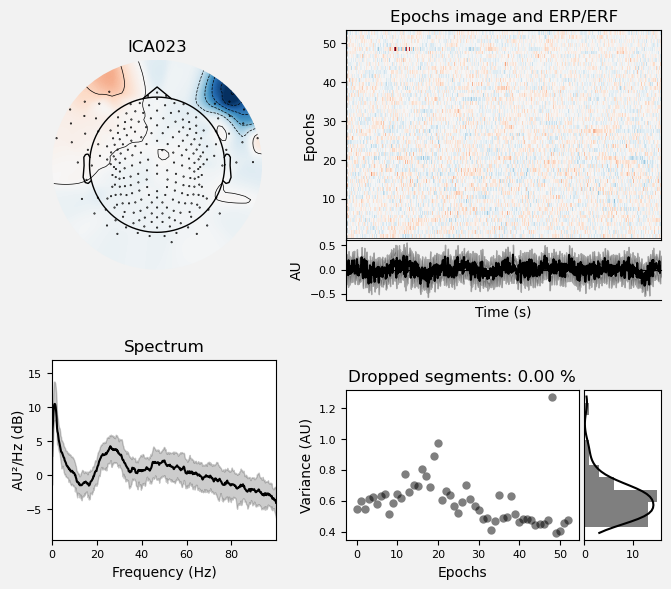

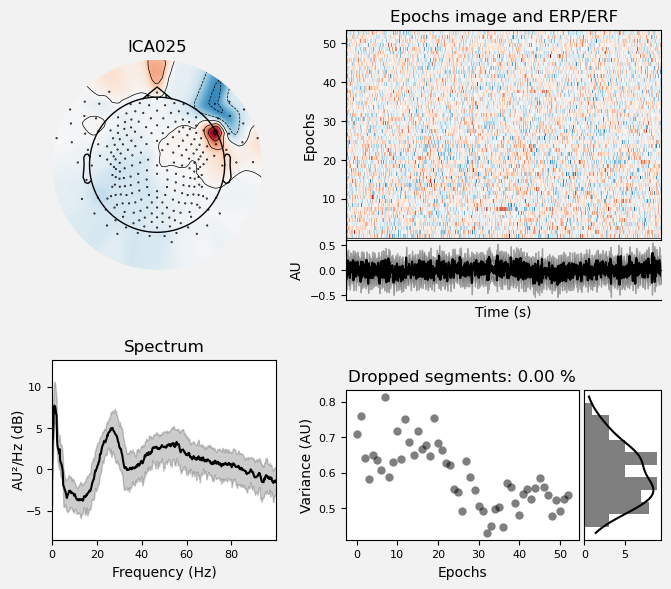

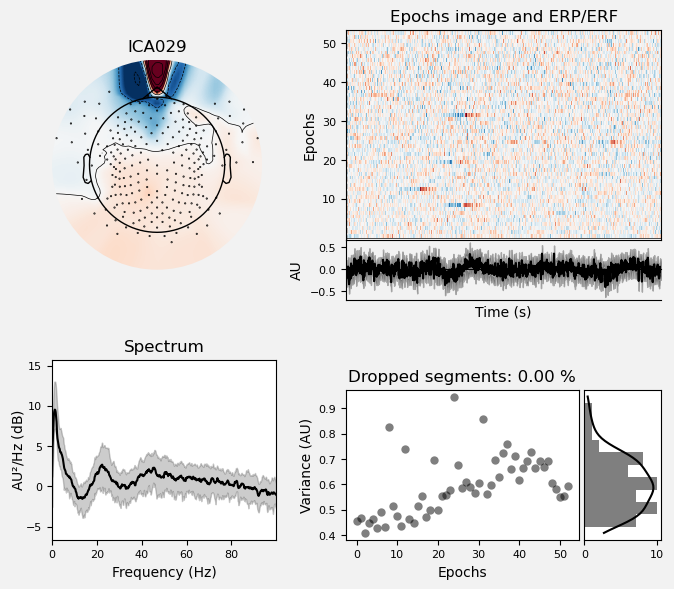

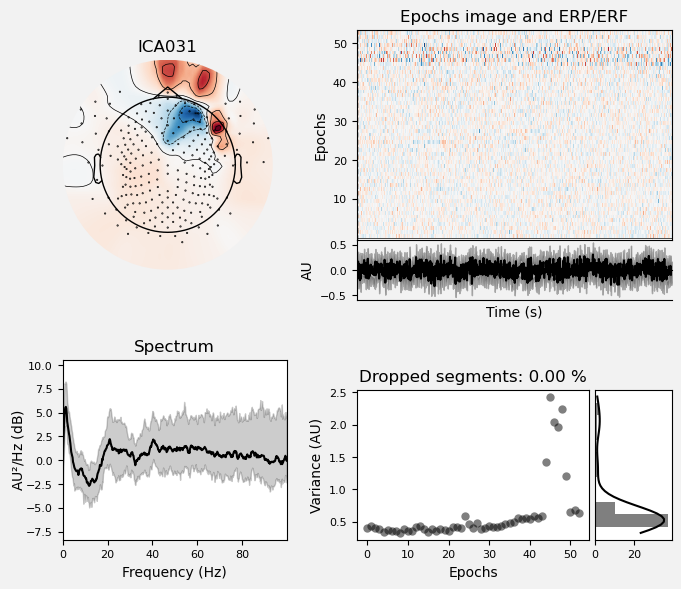

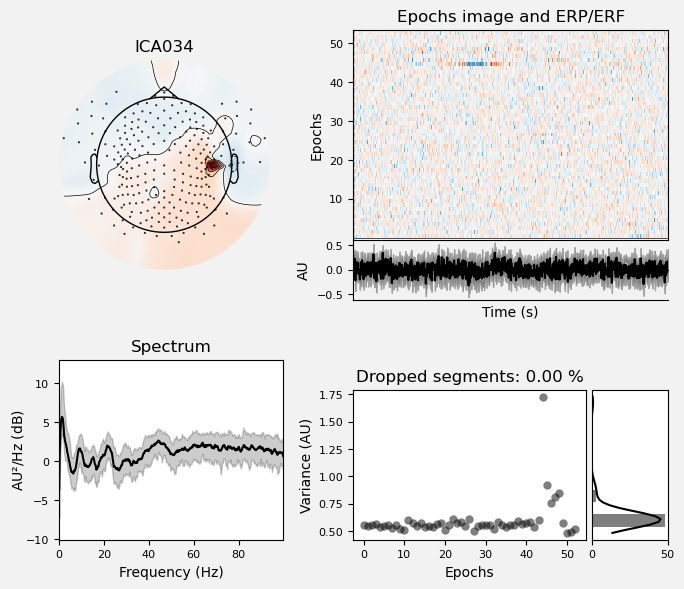

'channel noise'

[19, 28, 32, 38, 39, 40]

Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated


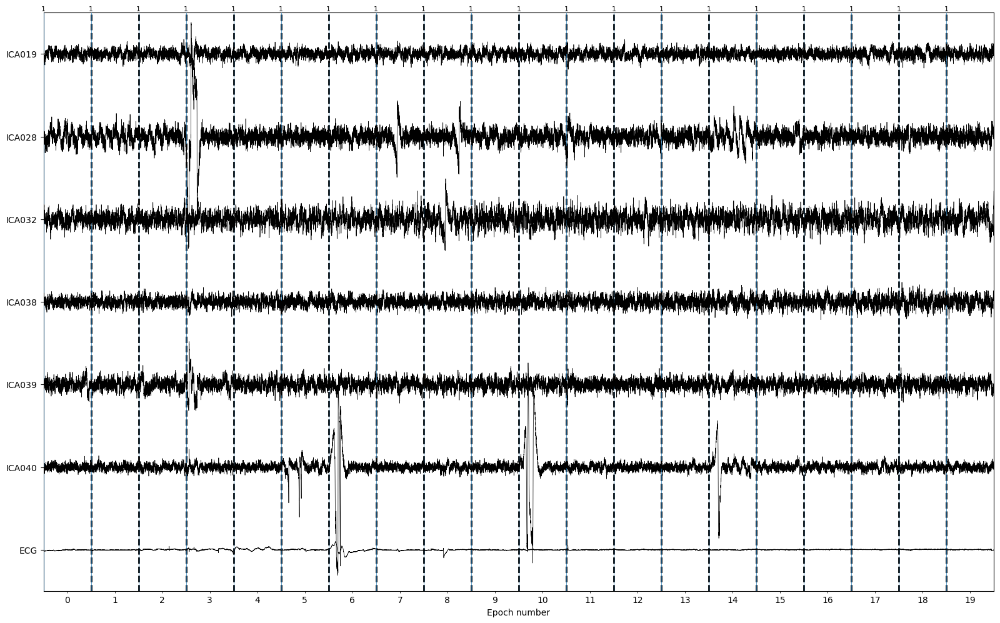

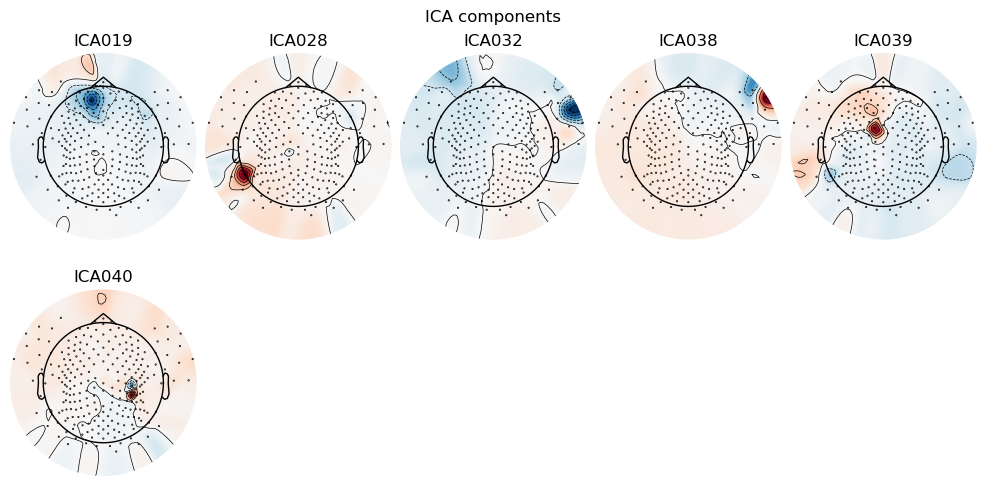

[19, 28, 32, 38, 39, 40]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
53 matching events found
No baseline correcti

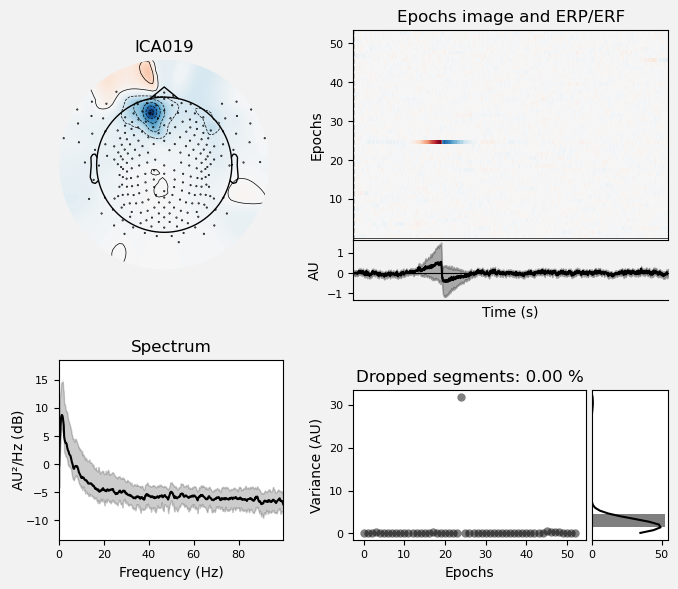

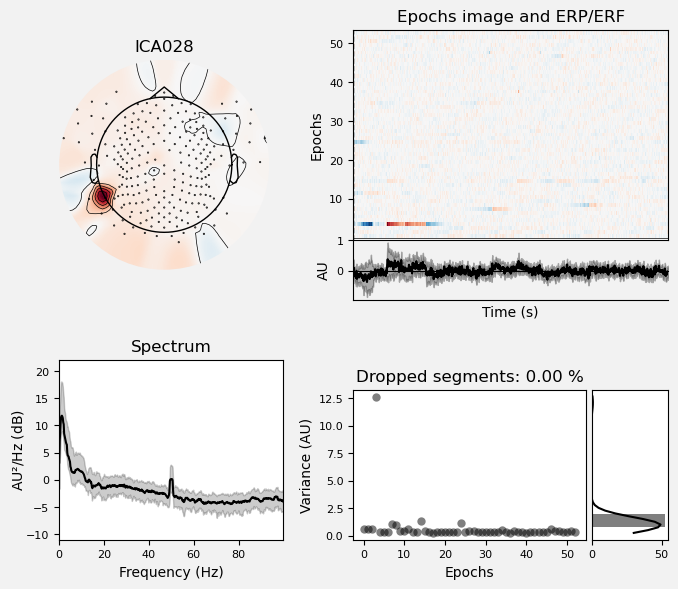

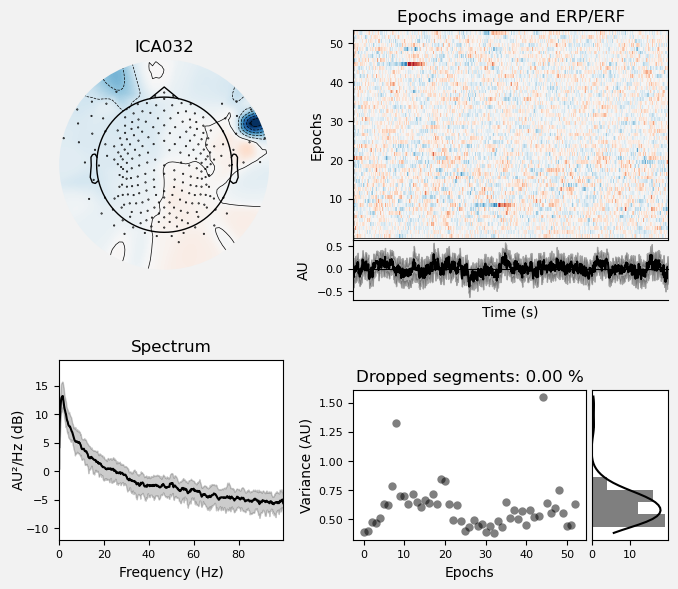

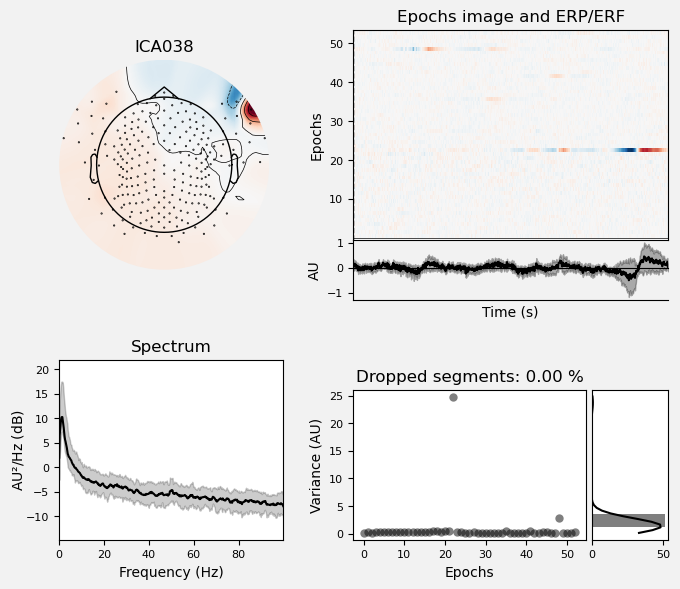

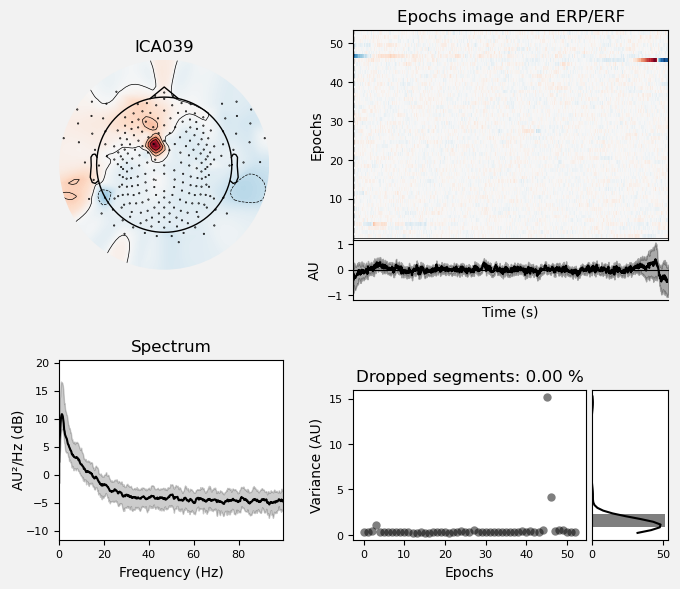

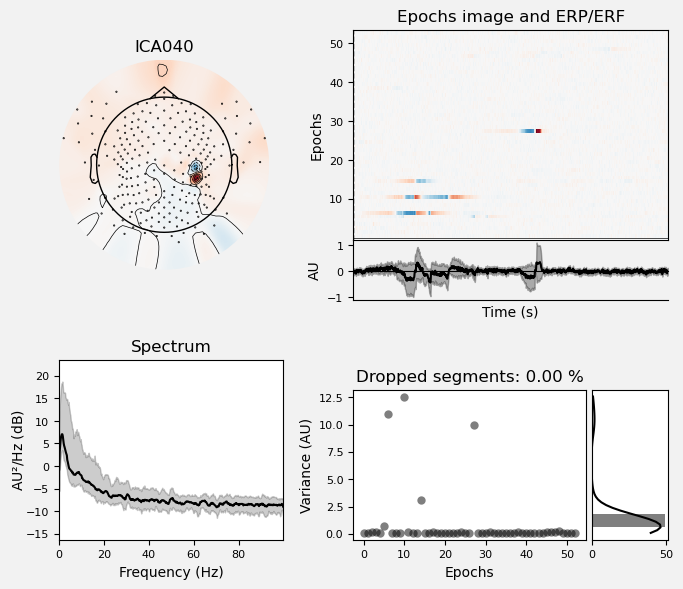

In [37]:

# exclude_types = ["heart beat", "muscle artifact", "eye blink"]
labels = label_components_ica(epochs, ica, reject_log=reject_log)
plot_ica_components(ica, epochs, labels, reject_log=reject_log)

Using EOG channel: E31
EOG channel index for this subject is: [30]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel E31 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2560 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 5 significant peaks
Number of EOG events detected: 5
Not setting metadata
5 matching events found
No baseline correction applied
Using data from preloaded Raw for 5 events and 257 original time points ...
0 bad epochs dropped
Using EOG channel: E31


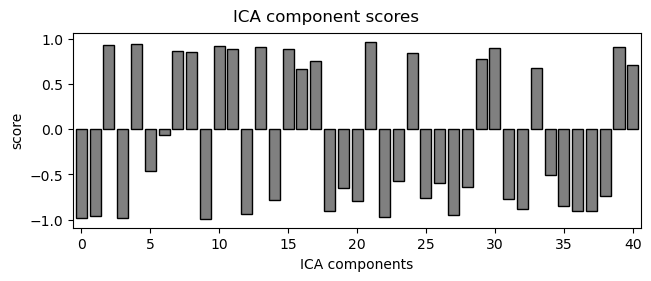

In [32]:
# ica_plot = ica.plot_sources(eeg_data)
# Exclude blink artifact components (use Fp1 as EOG proxy)
epochs_eog = mne.preprocessing.create_eog_epochs(raw=clean_raw, ch_name="E31")
eog_indices, eog_scores = ica.find_bads_eog(
    epochs_eog, ch_name="E31", threshold=2)
# ica.exclude = np.argwhere(abs(eog_scores) > 0.5).ravel().tolist()

# barplot of ICA component "EOG match" scores
ica.plot_scores(eog_scores)

# plot diagnostics
for idx in eog_indices:
    ica.plot_properties(epochs, picks=[idx], psd_args={"fmax": 100.0})

Instead of applying a high pass filter that can remove a spurious correlation to remove the baseline fluctuations I am using robust detrending using polynomials that ignore outliers [@decheveigne2018RobustDetrendingRereferencing]
Detrending is done twice - first using a line and then a higher-order polynomial to remove faster baseline fluctuations.


# Identifying bad channels


Applying ICA to Epochs instance
    Transforming to ICA space (16 components)
    Zeroing out 13 ICA components
    Projecting back using 243 PCA components
Running autoreject on ch_type=eeg


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/autoreject/utils.py:73: UserWarning: 15 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Creating augmented epochs : 0/243 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/243 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/8 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=32


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/autoreject/utils.py:73: UserWarning: 15 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Repairing epochs : 0/58 [00:00<?,       ?it/s]

Dropped 3 epochs: 25, 26, 57
Overwriting existing file.
Overwriting existing file.
No projector specified for this dataset. Please consider the method self.add_proj.


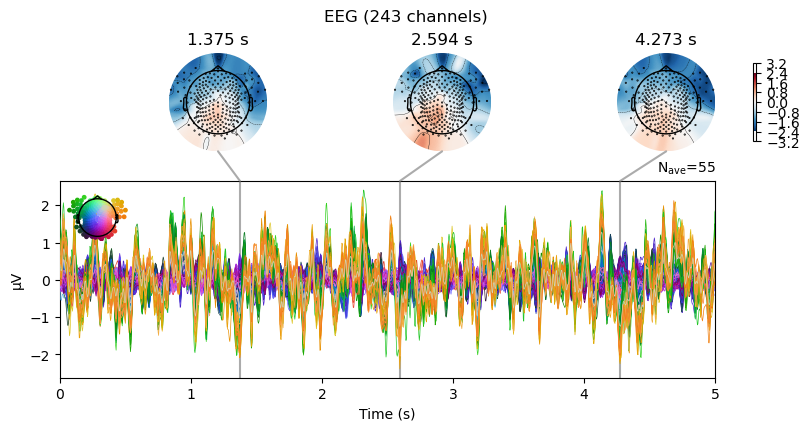

Effective window size : 5.004 (s)
Averaging across epochs...


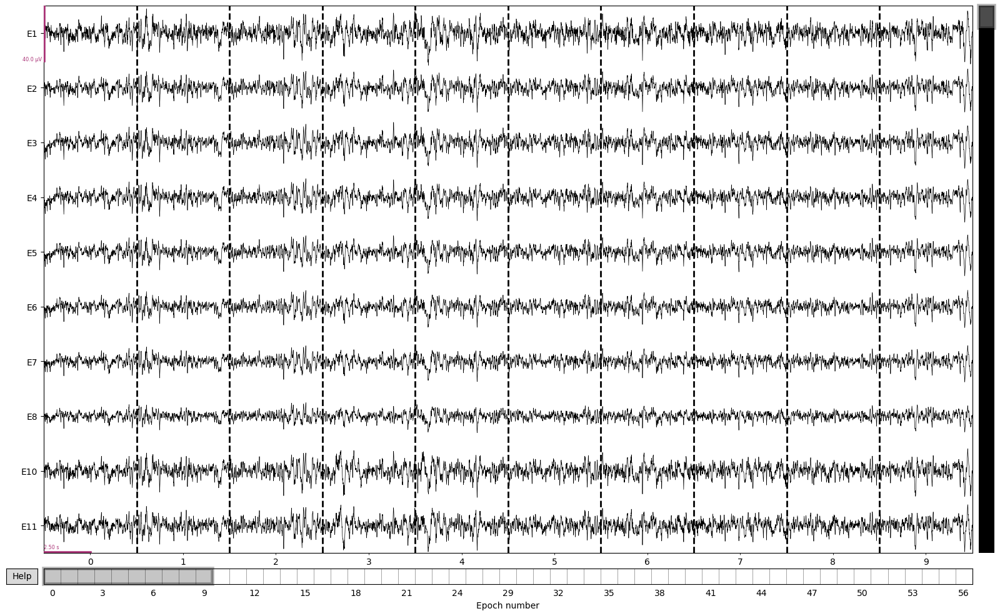

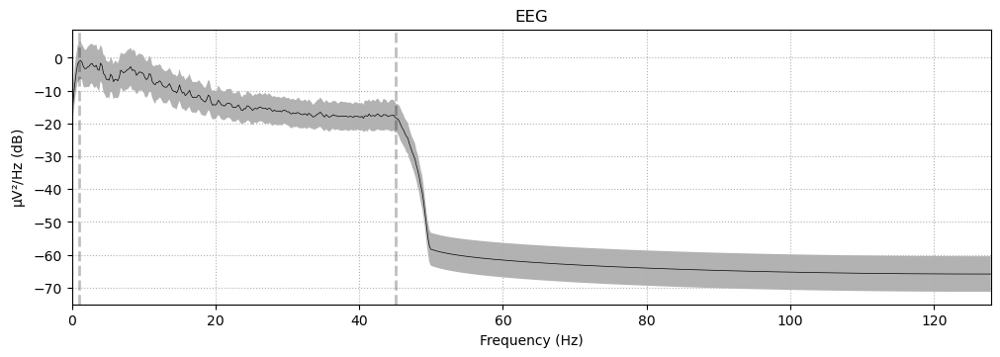

In [ ]:
ica.exclude = exclude  # [2,  6, 8, 11, 12, 19, 20,25,26]
epochs_clean = ica.apply(epochs.copy(), exclude=ica.exclude)
ar = autoreject.AutoReject(
    n_interpolate=[1, 2, 4, 8, 16, 32, 64, 128], random_state=11, n_jobs=1, verbose=True
)
ar.fit(epochs_clean)  # fit on a few epochs to save time
epochs_clean_ar, reject_clean_log = ar.transform(epochs_clean, return_log=True)


epochs_clean_ar.save(
    f"{preproc_path}/sub-{subject}-cleaned-epo.fif", overwrite=True)

plot_epochs(
    epochs_clean_ar,
    stage="final_epochs",
    n_epochs=10,
    n_channels=10,
)

In [ ]:
def specparam2pandas(fg):
    """
    Converts a FOOOFGroup object into a pandas DataFrame, with peak parameters and
    corresponding aperiodic fit information.

    Args:
    -----
    fg : specpramGroup
        The FOOOFGroup object containing the fitting results.

    Returns:
    --------
    peaks_df : pandas.DataFrame
        A DataFrame with the peak parameters and corresponding aperiodic fit information.
        The columns are:
        - 'CF': center frequency of each peak
        - 'PW': power of each peak
        - 'BW': bandwidth of each peak
        - 'error': fitting error of the aperiodic component
        - 'r_squared': R-squared value of the aperiodic fit
        - 'exponent': exponent of the aperiodic component
        - 'offset': offset of the aperiodic component
        - 'knee': knee parameter of the aperiodic component [if is initially present in the fg object]
    Notes:
    ------
    This function creates two DataFrames. The first DataFrame `fooof_aperiodic`
    contains the aperiodic fit information and is based on the `aperiodic_params`
    attribute of the FOOOFGroup object. The columns are inferred using the
    `get_ap_indices()` and `infer_ap_func()` functions from the FOOOF package.
    The second DataFrame `peak_df` contains the peak parameters and is based on the
    `peak_params` attribute of the FOOOFGroup object. The column names are renamed
    to match the headers of `fooof_aperiodic`, and the 'ID' column is cast to integer.
    The two DataFrames are then merged based on a shared 'ID' column.
    """

    fooof_aperiodic = (
        pd.DataFrame(
            fg.get_params("aperiodic_params"),
            columns=get_ap_indices(
                infer_ap_func(np.transpose(fg.get_params("aperiodic_params")))
            ),
        )
        .assign(error=fg.get_params("error"), r_squared=fg.get_params("r_squared"))
        .reset_index(names=["ID"])
    )
    return (
        pd.DataFrame(fg.get_params("peak_params"))  # prepare peaks dataframe
        .set_axis(["CF", "PW", "BW", "ID"], axis=1)  # rename cols
        .astype({"ID": int})
        .join(fooof_aperiodic.set_index("ID"), on="ID")
    )

    Using multitaper spectrum estimation with 7 DPSS windows


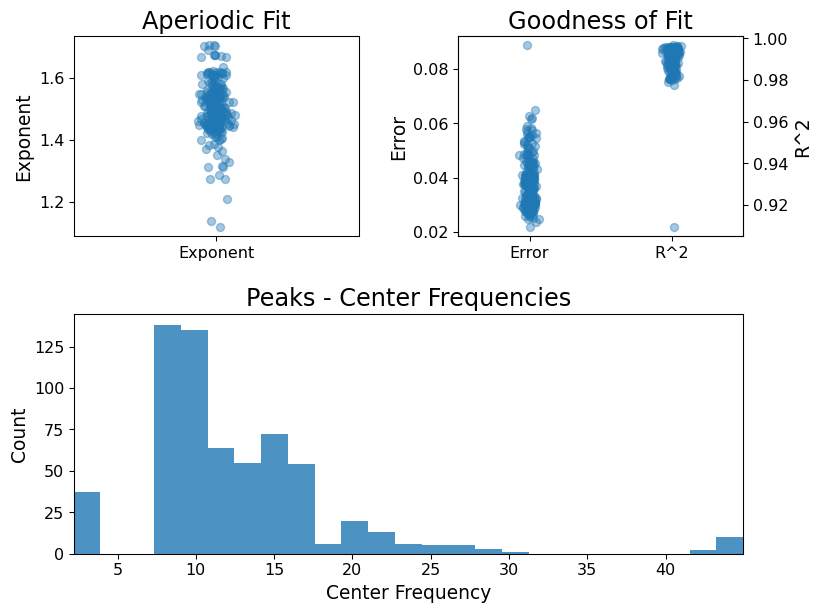

In [ ]:
from specparam.plts.spectra import plot_spectra
from specparam import SpectralGroupModel

psd = epochs_clean_ar.compute_psd().average()
spectra, freqs = psd.get_data(return_freqs=True)
# Initialize a FOOOFGroup object, with desired settings


fg = SpectralGroupModel(
    peak_width_limits=[1, 6],
    min_peak_height=0.15,
    peak_threshold=2.0,
    max_n_peaks=6,
    verbose=False,
)

# Define the frequency range to fit
freq_range = [2, 45]
fg.fit(freqs, spectra, freq_range)
fg.plot()

In [ ]:
import pandas as pd
from specparam.core.funcs import infer_ap_func
from specparam.core.info import get_ap_indices

df = specparam2pandas(fg)
df.to_csv(f"{preproc_path}/sub-{subject}-specparam.csv", index=False)
print(f"Subject {subject} done")